In [1]:
print('''A retail store that has multiple outlets across the country are facing issues in managing the inventory to match the demand with respect to supply. 
You are a data scientist, who has to come up with useful insights using the data and make prediction models to forecast the sales for X number of months/years.''')

A retail store that has multiple outlets across the country are facing issues in managing the inventory to match the demand with respect to supply. 
You are a data scientist, who has to come up with useful insights using the data and make prediction models to forecast the sales for X number of months/years.


In [2]:
print('1. Using the above data, come up with useful insights that can be used by each of the stores to improve in various areas.\n2. Forecast the sales for each store for the next 12 weeks.')

1. Using the above data, come up with useful insights that can be used by each of the stores to improve in various areas.
2. Forecast the sales for each store for the next 12 weeks.


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
import warnings
warnings.filterwarnings("ignore")

#### EDA

In [5]:
#Importing the Walmart.csv file as walmart
walmart = pd.read_csv(r"file:///C:\Users\Computech\Desktop\intellipaat handson\DataFrames\Walmart.csv")

In [6]:
walmart.shape

(6435, 8)

In [7]:
walmart.isna().sum()

#data has no null values

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [8]:
# This is the historical data that covers sales from 2010-02-05 to 2012-11-01, in the file Walmart_Store_sales. Within this file you will find the following fields:\

# Store - the store number
# Date - the week of sales
# Weekly_Sales - sales for the given store
# Holiday_Flag - whether the week is a special holiday week 1 – Holiday week 0 – Non-holiday week
# Temperature - Avg temperature on the week of sale
# Fuel_Price - Cost of fuel in the region
# CPI – Prevailing consumer price index
# Unemployment - Prevailing unemployment rate

In [9]:
walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28-09-2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05-10-2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12-10-2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667


In [10]:
#since we are going to be using Time Serier Model, only dates and the y(weekly_sales) varible is needed. So , i am dropping all the other varible now.

In [11]:
df = walmart[["Store", "Date", "Weekly_Sales"]]

In [12]:
#cheaking for values placed in null_spaces like ?, NA ,etc.
for i in df.columns:
    print(df[i].value_counts())

#no values repersenting null values found

Store
1     143
24    143
26    143
27    143
28    143
29    143
30    143
31    143
32    143
33    143
34    143
35    143
36    143
37    143
38    143
39    143
40    143
41    143
42    143
43    143
44    143
25    143
23    143
2     143
22    143
3     143
4     143
5     143
6     143
7     143
8     143
9     143
10    143
11    143
12    143
13    143
14    143
15    143
16    143
17    143
18    143
19    143
20    143
21    143
45    143
Name: count, dtype: int64
Date
05-02-2010    45
23-12-2011    45
11-11-2011    45
18-11-2011    45
25-11-2011    45
              ..
07-01-2011    45
14-01-2011    45
21-01-2011    45
28-01-2011    45
26-10-2012    45
Name: count, Length: 143, dtype: int64
Weekly_Sales
1643690.90    1
446751.45     1
1332261.01    1
1366193.35    1
1384870.51    1
             ..
551799.63     1
573498.64     1
553901.97     1
533161.64     1
760281.43     1
Name: count, Length: 6435, dtype: int64


In [13]:
df.duplicated().sum()
# no duplicated values

0

In [14]:
df.nunique()

Store             45
Date             143
Weekly_Sales    6435
dtype: int64

In [15]:
#converting Date column to datetime type
df.Date = pd.to_datetime(df.Date, dayfirst= True)

In [16]:
df.dtypes

Store                    int64
Date            datetime64[ns]
Weekly_Sales           float64
dtype: object

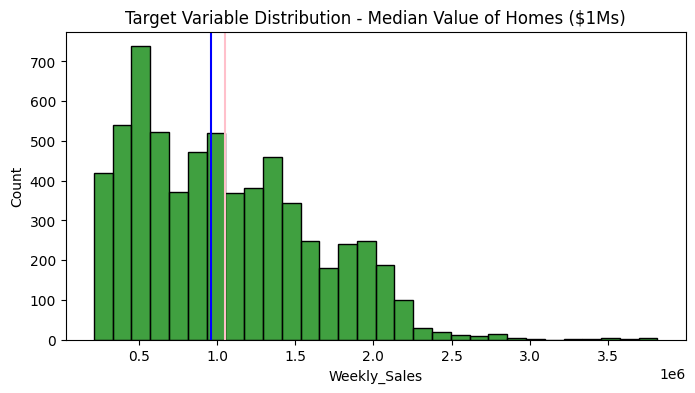

In [17]:
mean = np.mean(df.Weekly_Sales)
median = np.median(df.Weekly_Sales)
plt.figure(figsize=[8,4])
sns.histplot(df["Weekly_Sales"], color='g',bins= 30, )
plt.axvline(mean, c= "pink")
plt.axvline(median, c= "b")
plt.title('Target Variable Distribution - Median Value of Homes ($1Ms)')
plt.show()

#Distribution of Weekly Sales

In [18]:
salesBYstore = walmart["Weekly_Sales"].groupby(walmart.Store).agg("sum")
salesBYstore.sort_values(ascending= True, axis= 0, inplace= True)

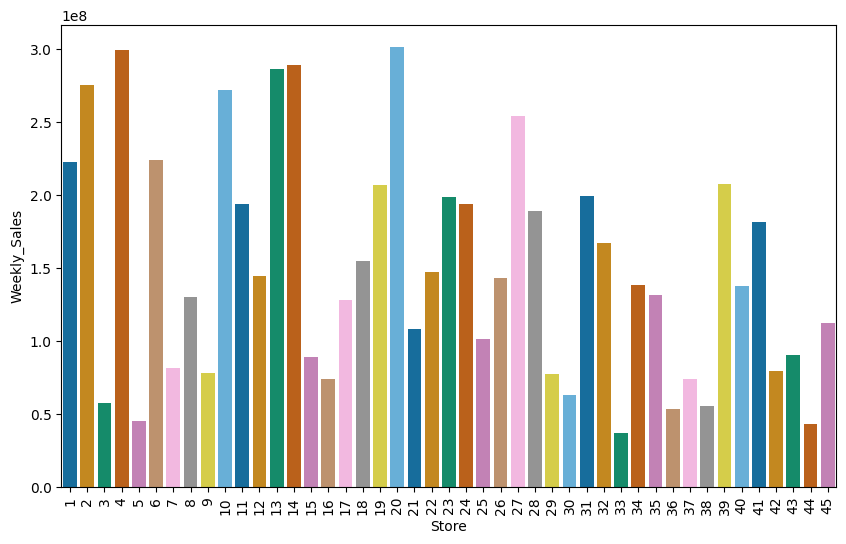

In [19]:
plt.figure(figsize=(10,6))
sns.barplot(salesBYstore, palette= "colorblind")
plt.xticks(rotation= 90)
plt.show()

# see Sales store Store wise

#### Processing

In [20]:
#Create seperate dataframe for each store for individual processing and analysis 

for i in range(1, 46):
    exec(f"Store_{i} = df[df.Store == {i}]")

In [21]:
for i in range(1, 46):
    exec(f"Store_{i}.index = Store_{i}.Date")
    exec(f"Store_{i}.drop('Date', axis= 1, inplace= True)")
    exec(f"Store_{i}.drop('Store', axis= 1, inplace= True)")

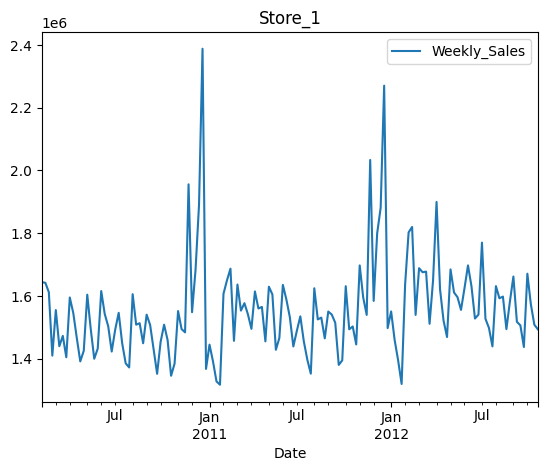

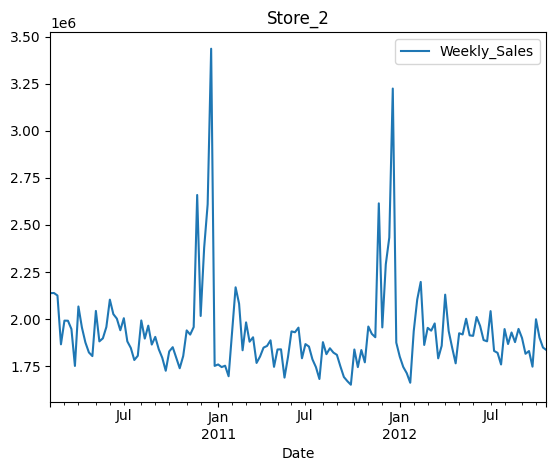

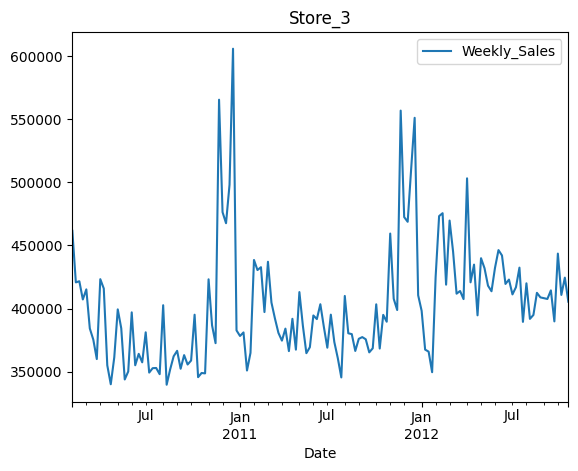

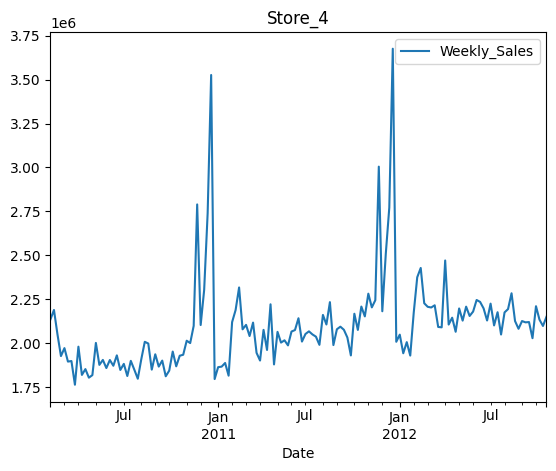

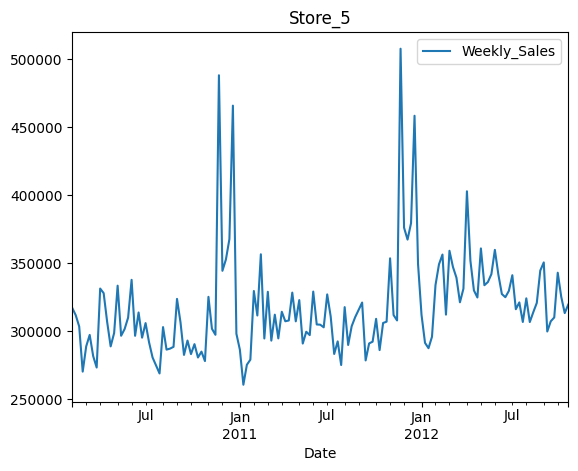

...

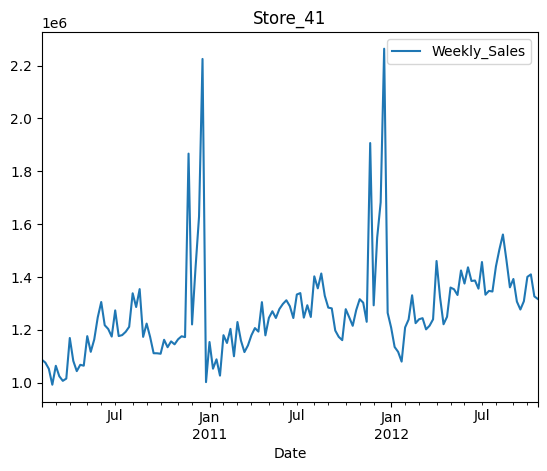

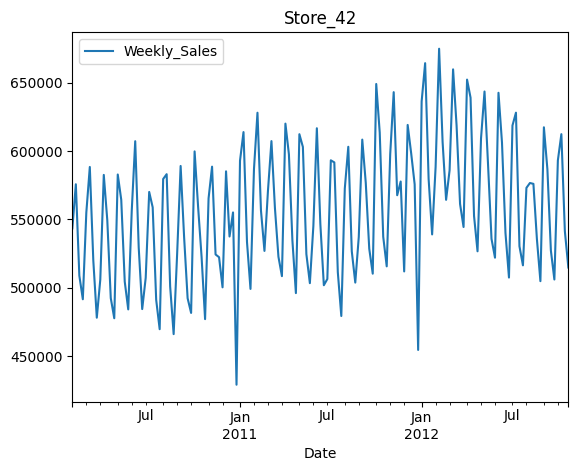

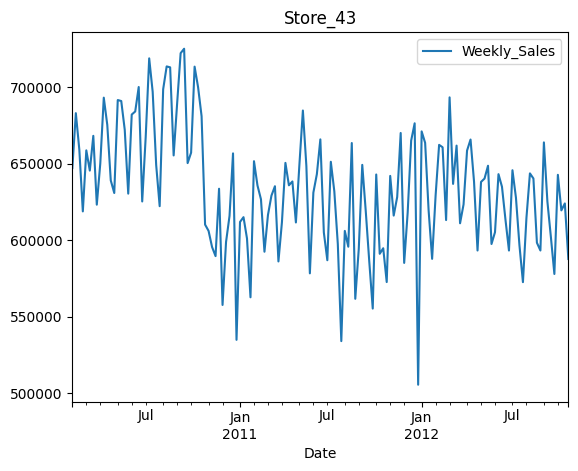

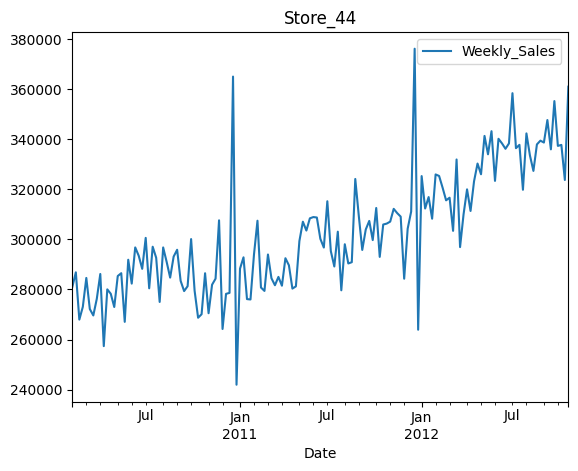

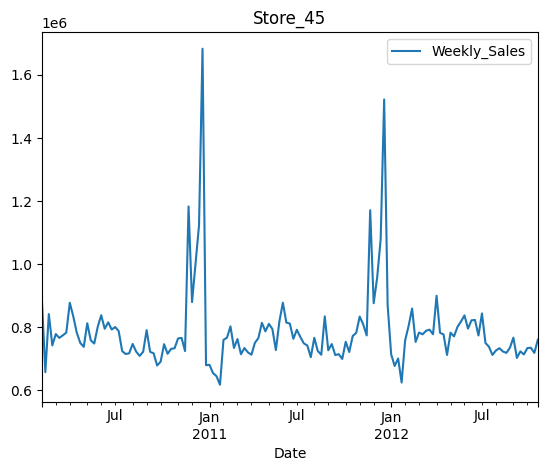

In [22]:
for i in range(1,46):
    exec(f"Store_{i}.plot()")
    plt.title(f"Store_{i}")


#### Stationality Analysis

In [23]:
#ADfuller Stationality test 
from statsmodels.tsa.stattools import adfuller

In [24]:
AD = pd.DataFrame(columns=["Store", "p_value", "no_of_lag"])
for i in range(1,46):
    exec(f"results = adfuller(Store_{i}) ")
    AD.loc[i-1] = [f"Store_{i}", results[1], results[2]]
    
AD

,Store,p_value,no_of_lag
0,Store_1,1.387779e-05,4
1,Store_2,3.990207e-03,6
2,Store_3,3.840926e-02,6
3,Store_4,4.779866e-02,6
4,Store_5,4.251706e-04,4
5,Store_6,2.159486e-06,4
6,Store_7,2.170072e-04,7
7,Store_8,1.002746e-06,4
8,Store_9,2.134309e-05,4
9,Store_10,8.763068e-06,4


In [25]:
pd.options.display.float_format = '{:.8f}'.format

In [26]:
AD[AD.p_value >= 0.05]
# the following Stores are not stationary    

,Store,p_value,no_of_lag
13,Store_14,0.06786987,6
29,Store_30,0.16836388,6
35,Store_36,0.97301588,8
37,Store_38,0.91656348,12
41,Store_42,0.45728516,12
42,Store_43,0.10605877,11
43,Store_44,0.75916186,3


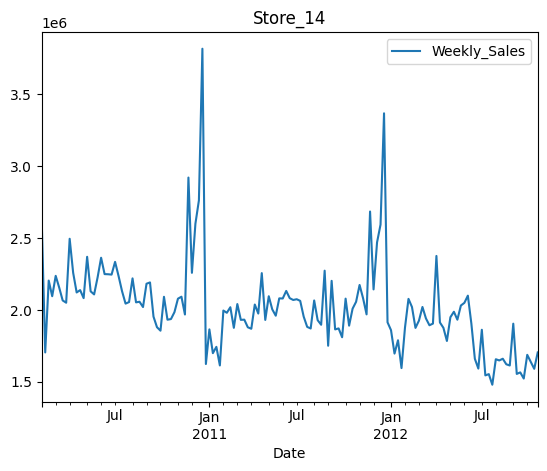

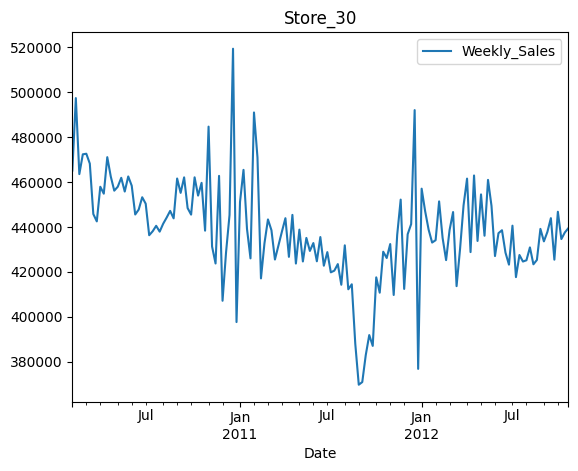

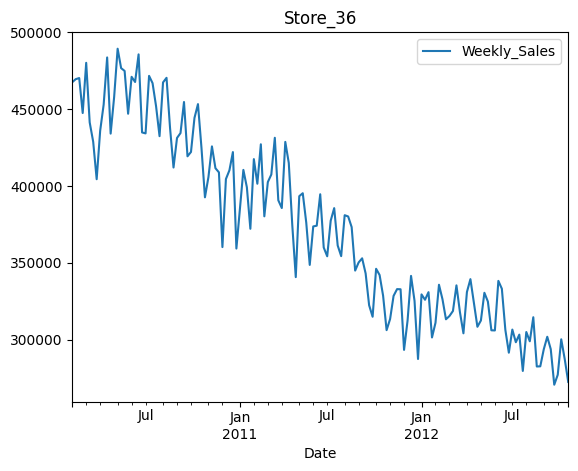

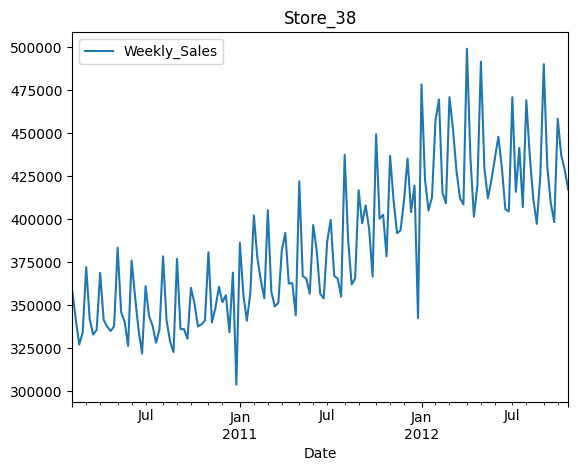

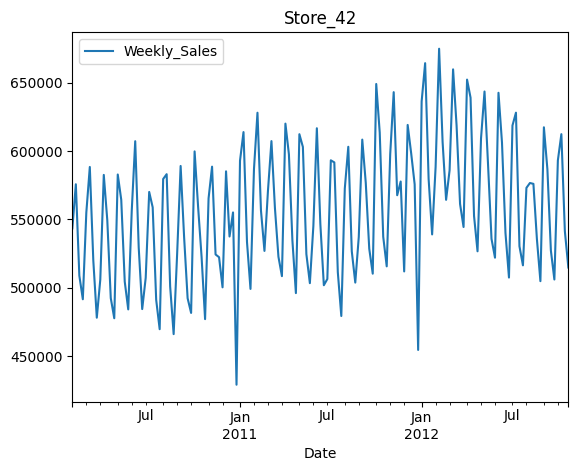

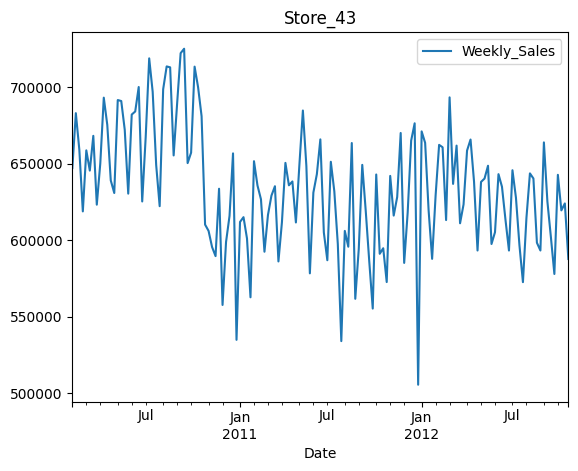

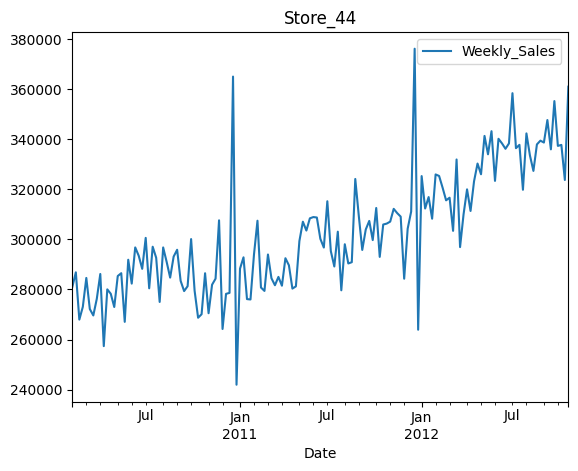

In [27]:
#plotting all the non-stationary Stores
non_sta =AD[AD.p_value >= 0.05] 
non_sta.reset_index(inplace= True, drop= True)
for i in range(0, 7):
    exec(f"Store_{int(non_sta['Store'].values[i][-2:])}.plot()") 
    plt.title(f"Store_{int(non_sta['Store'].values[i][-2:])}")

In [28]:
# rolling statictics
n_Stores = list(non_sta["Store"])
for i in n_Stores:
    exec(f"roll_{i} = {i}.rolling(window= 2).mean()")
    exec(f"diff_{i} = {i}- roll_{i}")

In [29]:
for i in range(0,7):
        exec(f"print(diff_Store_{non_sta.Store.iloc[i][-2:]})")


               Weekly_Sales
Date                       
2010-02-05              NaN
2010-02-12 -459625.55500000
2010-02-19  250168.93000000
2010-02-26  -54482.53500000
2010-03-05   70976.56000000
...                     ...
2012-09-28  -21420.13000000
2012-10-05   82539.98000000
2012-10-12  -24003.27500000
2012-10-19  -24655.44500000
2012-10-26   57041.45000000

[143 rows x 1 columns]
              Weekly_Sales
Date                      
2010-02-05             NaN
2010-02-12  16133.02500000
2010-02-19 -16930.65500000
2010-02-26   4408.72500000
2010-03-05    130.18000000
...                    ...
2012-09-28  -9240.80000000
2012-10-05  10670.70500000
2012-10-12  -6079.09500000
2012-10-19   1472.01500000
2012-10-26    943.60500000

[143 rows x 1 columns]
              Weekly_Sales
Date                      
2010-02-05             NaN
2010-02-12   1008.48000000
2010-02-19    358.66500000
2010-02-26 -11380.79500000
2010-03-05  16341.99500000
...                    ...
2012-09-28 -11563.235

In [30]:
# Dropping all Null values
for i in range(0,7):
        exec(f"diff_Store_{non_sta.Store.iloc[i][-2:]}.dropna(inplace= True)")

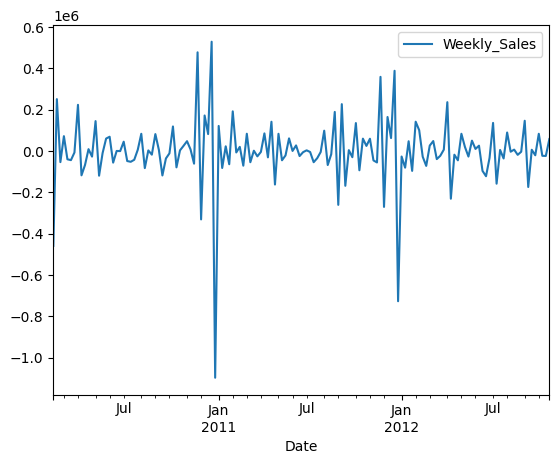

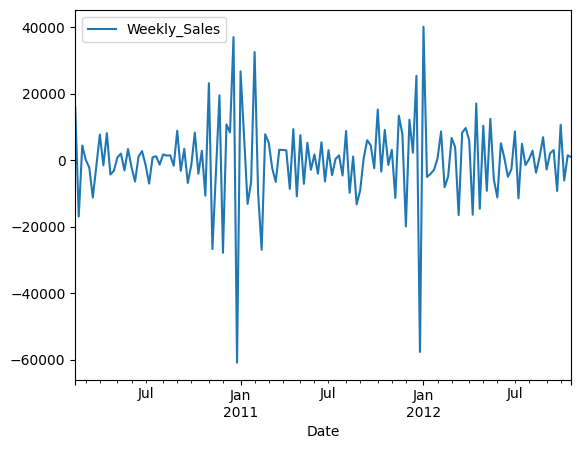

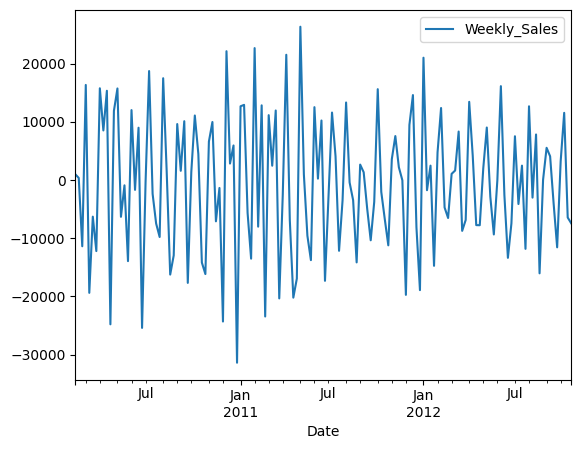

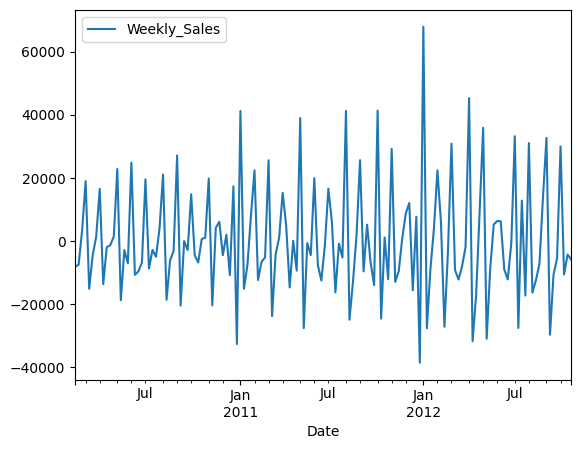

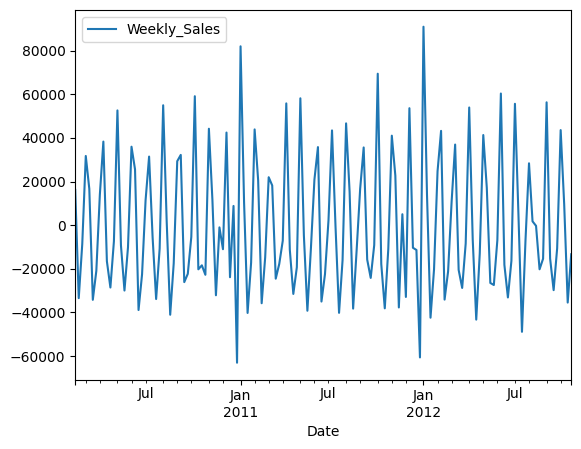

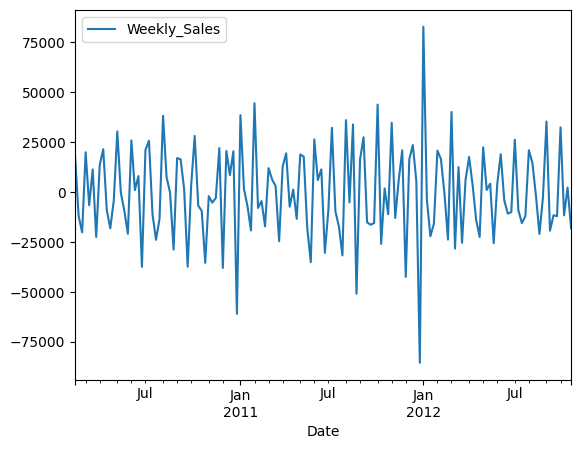

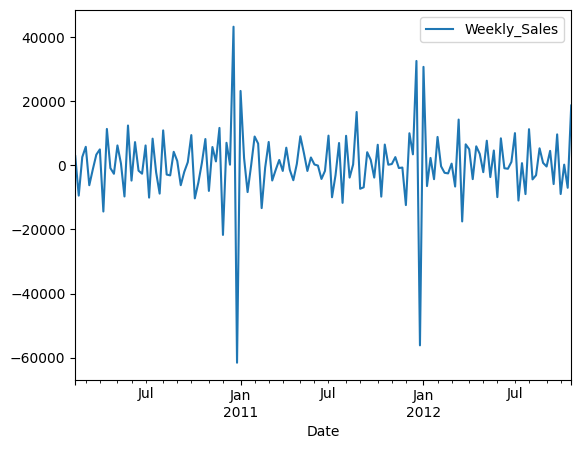

In [31]:
for i in range(0,7):
        exec(f"diff_Store_{non_sta.Store.iloc[i][-2:]}.plot()")

#all the trends are removed

In [32]:
#Test adfuller again 
AD = pd.DataFrame(columns=["Store", "p_value", "no_of_lag"])
for i in range(0,7):
    exec(f"results = adfuller(diff_Store_{non_sta.Store.iloc[i][-2:]}) ")
    AD.loc[i-1] = [f"diff_Store_{non_sta.Store.iloc[i][-2:]}", results[1], results[2]]

AD

,Store,p_value,no_of_lag
-1,diff_Store_14,0.00000000,5
0,diff_Store_30,0.00000000,5
1,diff_Store_36,0.00079076,9
2,diff_Store_38,0.00005901,11
3,diff_Store_42,0.00097574,11
4,diff_Store_43,0.00278047,12
5,diff_Store_44,0.00000000,3


In [38]:
# making copy of the original non-stationary data of Stores
for i in range(0,7):
        exec(f"ori_Store_{non_sta.Store.iloc[i][-2:]} = Store_{non_sta.Store.iloc[i][-2:]}.copy()")

# replacing non-stationary Store data with transformed data
for i in range(0,7):
        exec(f"Store_{non_sta.Store.iloc[i][-2:]} = diff_Store_{non_sta.Store.iloc[i][-2:]}.copy()")

#### ACF

In [36]:
# Checking PACF for optimal no.of lag
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

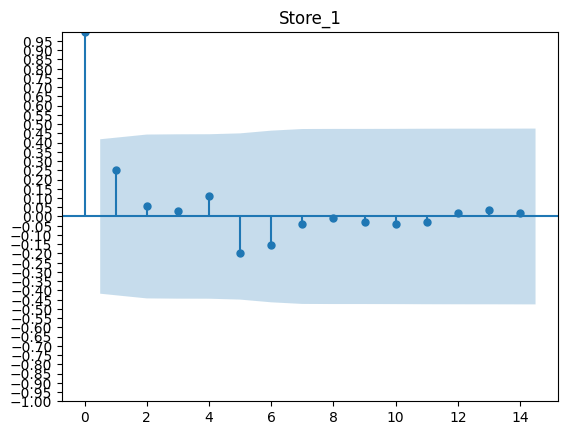

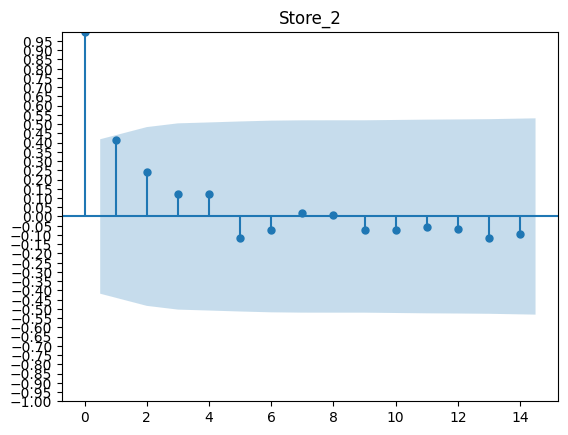

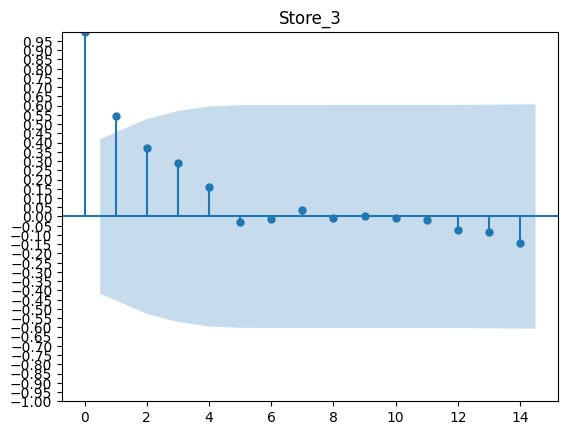

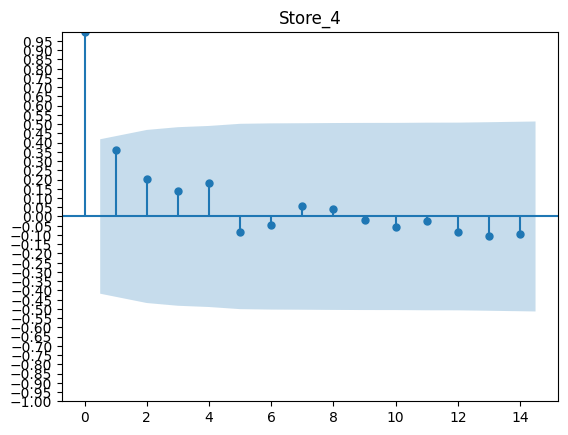

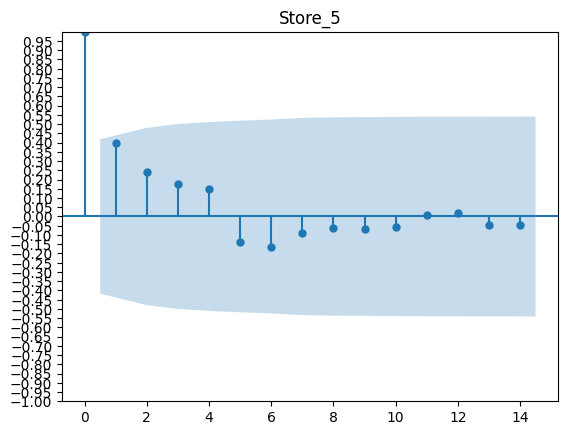

...

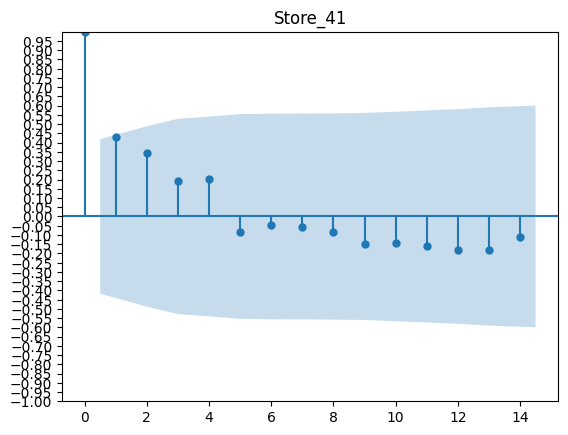

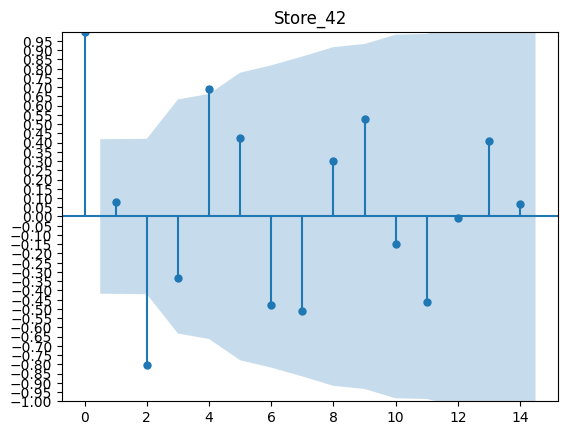

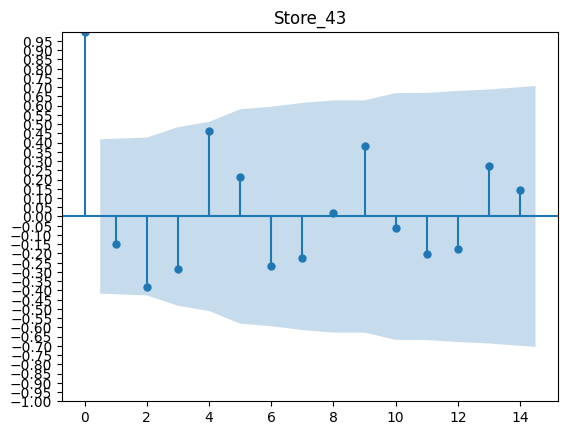

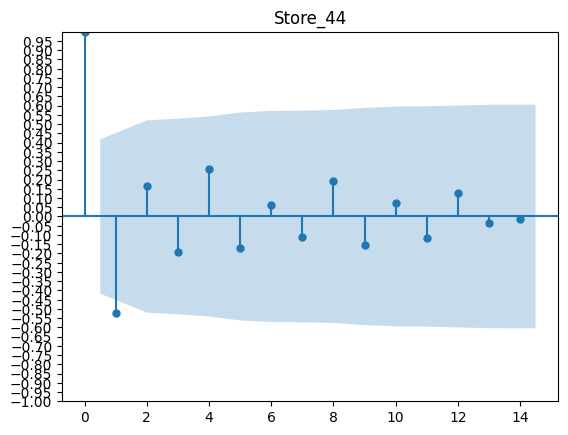

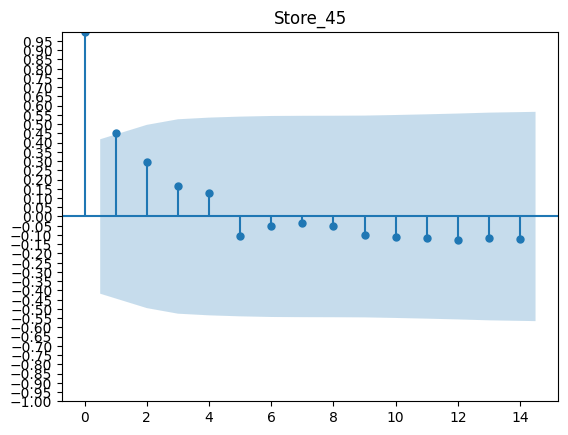

In [107]:
for i in range(1, 46):
    exec(f"ACf = acf(Store_{i})")
    exec(f"plot_acf(ACf)")
    # plt.figure(figsize=(5,20))
    plt.ylim(bottom = 0.5)
    plt.title(f"Store_{i}")
    plt.yticks(np.arange(-1, 1, 0.05))
    plt.show()

In [269]:
ACF_sig = pd.DataFrame(columns=["Stores", "significant(q)"])

for i in range(1, 46):
    sig = 0 #1
    exec(f"ACf = acf(Store_{i})")
    for j in ACf:
        if (j >= 0.425) | (j <= -0.425):
            sig+=1
            
        ACF_sig.loc[i-1] = [f"Store_{i}", sig]

In [270]:
ACF_sig

,Stores,significant(q)
0,Store_1,1
1,Store_2,1
2,Store_3,2
3,Store_4,1
4,Store_5,1
5,Store_6,2
6,Store_7,3
7,Store_8,1
8,Store_9,2
9,Store_10,2


#### PACF

In [ ]:
# Cheaking PACF for order of AR(q)

In [187]:
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf

[ 1.          0.30375985  0.04021628  0.01219543  0.23927843 -0.30788835
 -0.0014493   0.14798536 -0.05206473  0.1547872  -0.03652748 -0.08797706
  0.16184013  0.03250986  0.03380417  0.10062548 -0.04966531  0.04265725
  0.02866535 -0.0672978  -0.0144685  -0.16282794]


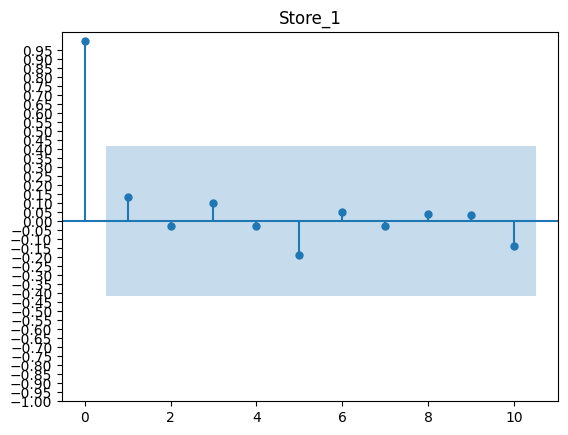

[ 1.          0.38587372  0.10823551 -0.04658177  0.17916511 -0.33086122
 -0.0192553   0.20004553 -0.10931221  0.01105632 -0.03023624 -0.11649167
  0.09603219 -0.0947752  -0.07070914  0.09128467 -0.03215824 -0.01709414
 -0.07026318 -0.12648523  0.00434761 -0.08791359]


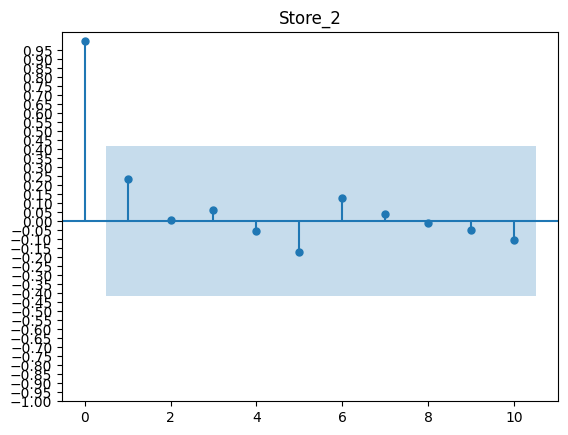

[ 1.          0.53042557  0.16668644  0.16412365  0.07607959 -0.30861064
  0.03206715  0.20732115  0.03058033  0.15655645 -0.07733061 -0.03305565
 -0.00670322  0.04113646 -0.00272844 -0.01149093 -0.02874185  0.01255839
 -0.12058603  0.05944455 -0.10975721 -0.10468814]


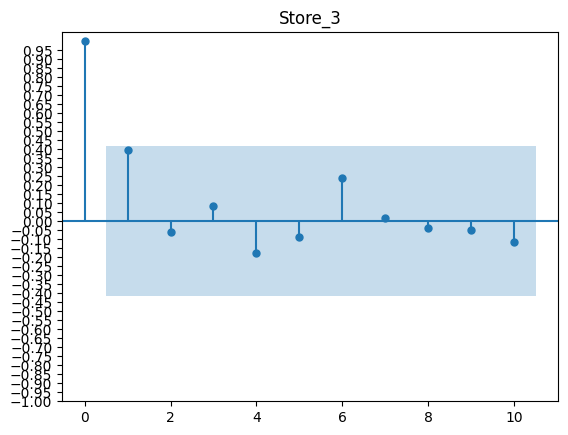

[ 1.          0.42660057  0.14997967  0.05755091  0.26798839 -0.26983153
  0.04846441  0.19886998 -0.03604879  0.17085998 -0.05515318 -0.02977369
  0.08230812 -0.07078321  0.07406462  0.12552134 -0.10985915  0.0946333
 -0.05996523 -0.03564473  0.0082363  -0.104122  ]


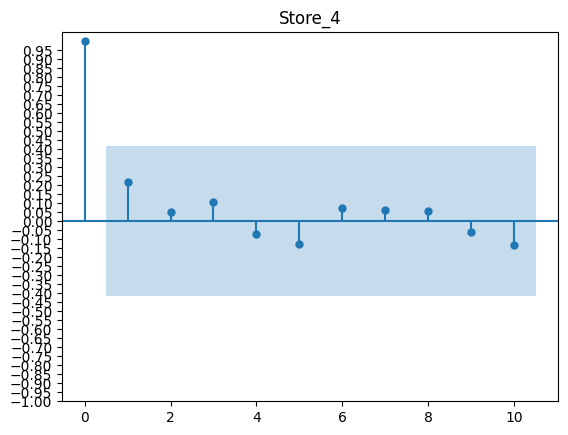

[ 1.          0.39565087  0.1616187   0.10547154  0.21688496 -0.28930761
 -0.10625789  0.06561078  0.02149848  0.1784112   0.01079885  0.00812224
  0.05578282 -0.10641902  0.068714    0.06484969  0.02251253  0.01099254
 -0.0637116  -0.00994979 -0.03459717  0.04804106]


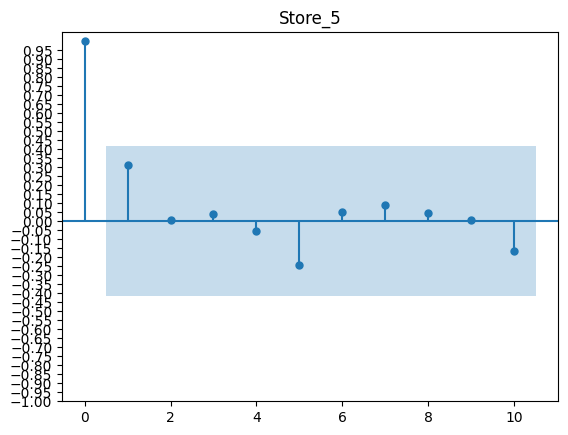

[ 1.          0.45143291  0.08302191 -0.00701708  0.13695271 -0.36834099
 -0.07113265  0.00737363 -0.15164157  0.01766205 -0.12900948 -0.06748705
  0.0467031  -0.22598248 -0.04213595  0.06351208 -0.07338431 -0.03747434
 -0.10293774 -0.15800903 -0.00773602 -0.07637555]


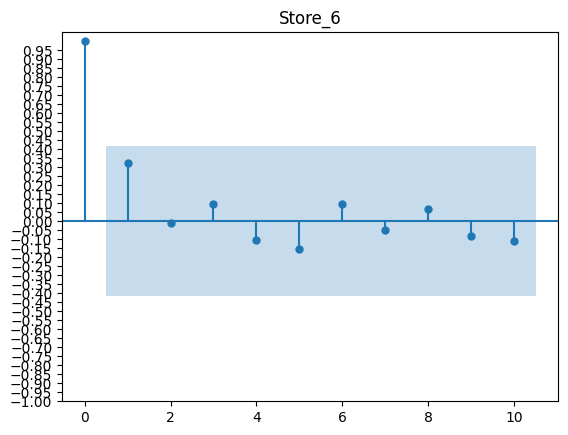

[ 1.          0.67555153  0.1770017  -0.03198481  0.16334376 -0.31167981
 -0.11867379 -0.05053179 -0.15484935  0.12722328 -0.00683699  0.04716576
  0.07343306 -0.12031046 -0.06386995  0.04651809 -0.0545765  -0.04276698
  0.09270705  0.02022465  0.11095611  0.04118283]


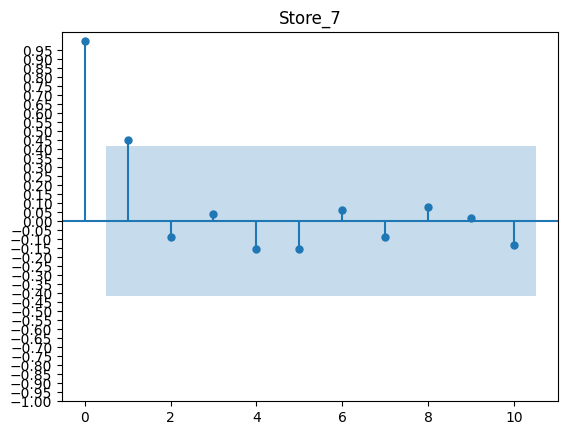

[ 1.          0.36846231  0.10431222 -0.00792999  0.1401199  -0.36645394
  0.06256199  0.16484149  0.0370969   0.07603084 -0.14192128 -0.03350363
  0.04487627 -0.02670816  0.03882403  0.04649416 -0.00227411 -0.01754202
 -0.12425464 -0.02294522 -0.08385892 -0.09434268]


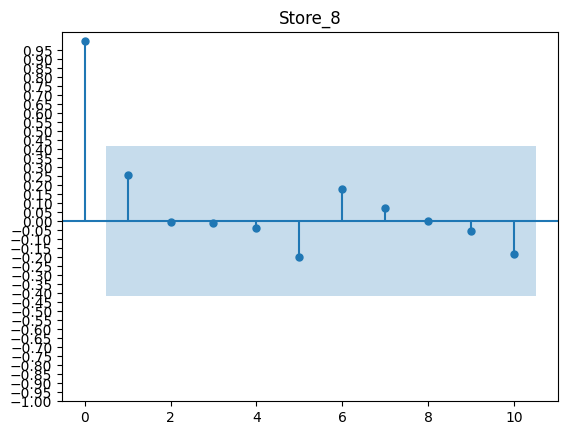

[ 1.          0.44164057  0.12755867  0.03474123  0.157838   -0.33849997
  0.06848219  0.14037044  0.06406621  0.03837342 -0.09159405  0.00891474
  0.04136338 -0.01762795  0.07419807  0.06790756  0.01404099 -0.01375784
 -0.06576871  0.03534452  0.02694925 -0.04677703]


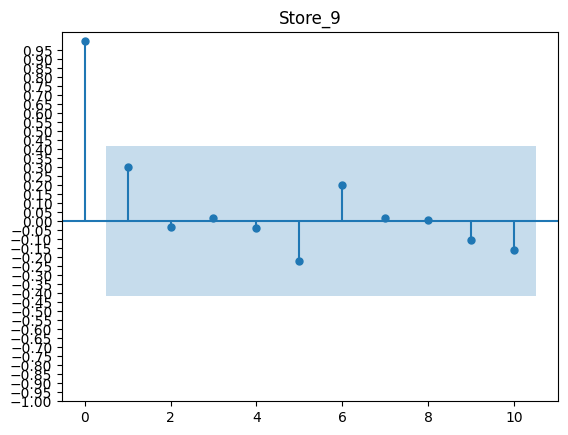

[ 1.00000000e+00  4.80710463e-01  1.25140059e-01 -8.35996500e-04
  1.33548506e-01 -3.57452882e-01  4.80480110e-02  1.47443631e-01
 -9.71115548e-02  1.13873726e-01 -1.24842633e-01 -4.90837747e-02
  6.02582802e-02 -1.29289085e-01  1.10068541e-01  4.75541556e-02
 -7.04098938e-02  6.53175215e-02 -8.21140893e-02 -2.85029559e-02
 -9.83208031e-02 -1.13424433e-01]


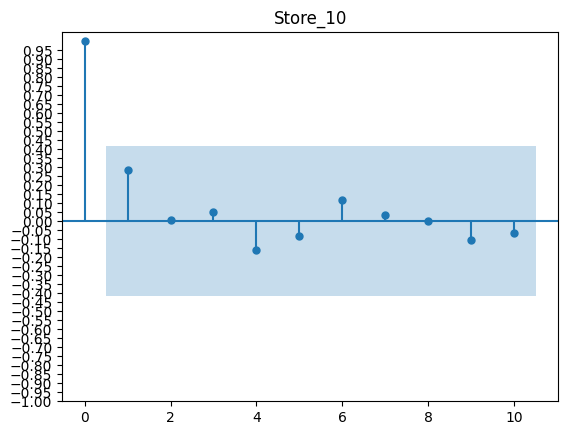

[ 1.          0.40113572  0.04226223 -0.04502107  0.12268387 -0.37573751
  0.08407504  0.18166489 -0.10960841  0.09789749 -0.13686901 -0.06941179
  0.12145248 -0.13921843  0.04792868  0.07248687  0.00783703  0.1139951
 -0.03857137 -0.10445084 -0.06035307 -0.13718824]


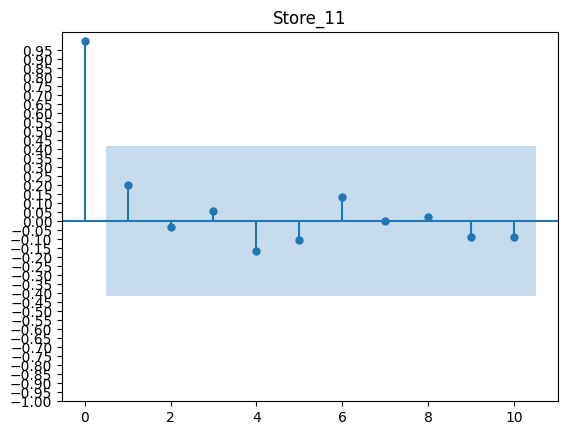

[ 1.          0.39886982  0.1210488  -0.02054055  0.15063495 -0.38072223
  0.06138142  0.10343093 -0.05300604  0.13278034 -0.06537579 -0.01979658
  0.15322841 -0.14772149  0.05404806  0.07567688  0.03925869  0.02561724
 -0.17096419 -0.07064071 -0.09258358 -0.07301189]


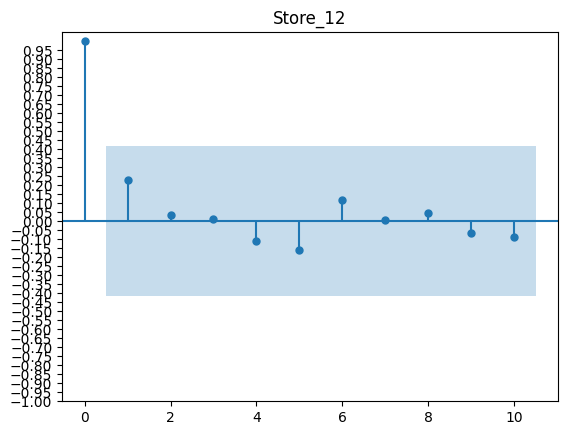

[ 1.          0.39896239  0.11651723 -0.06042087  0.18300893 -0.35981799
  0.02093261  0.10131324 -0.09540894  0.06870214 -0.09794417 -0.10782464
  0.01197159 -0.11438115  0.02613984  0.05664327  0.03420793  0.04234205
 -0.05693861 -0.04293478  0.01249771 -0.01313916]


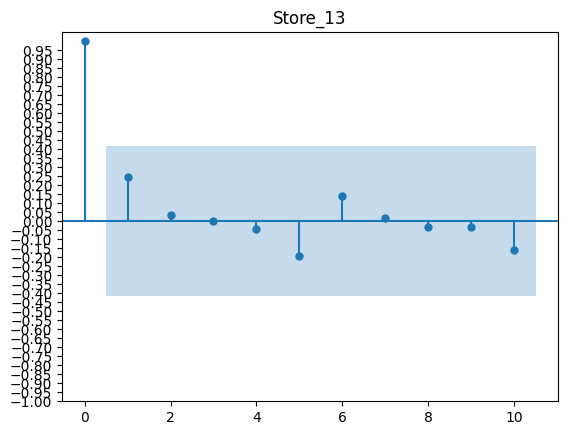

[ 1.00000000e+00 -4.69289024e-01 -1.33472360e-01 -2.91467111e-01
  1.54896840e-01 -1.41260940e-01 -2.40397522e-01 -6.54063988e-02
 -1.67451795e-01  6.19469095e-04 -9.76774401e-02  1.55514988e-02
 -1.44538689e-01 -9.69100244e-02 -1.53647612e-01 -4.31820316e-02
 -3.15293412e-02 -3.31306195e-03 -2.88936174e-02 -1.70416967e-01
 -4.54989286e-02 -1.74784509e-01]


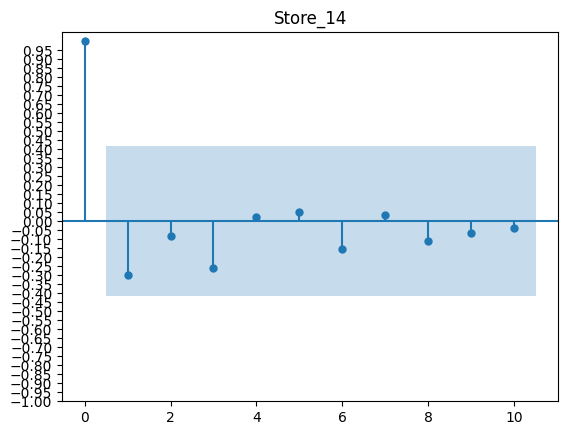

[ 1.          0.43974614  0.09638013  0.01049889  0.13739007 -0.39466489
 -0.01600504  0.04464222 -0.06608005  0.06404476 -0.18244736 -0.05632415
 -0.0346437  -0.1153565   0.05718024 -0.00180122 -0.06209321 -0.05461992
 -0.19656351  0.02895882  0.02619021 -0.00264376]


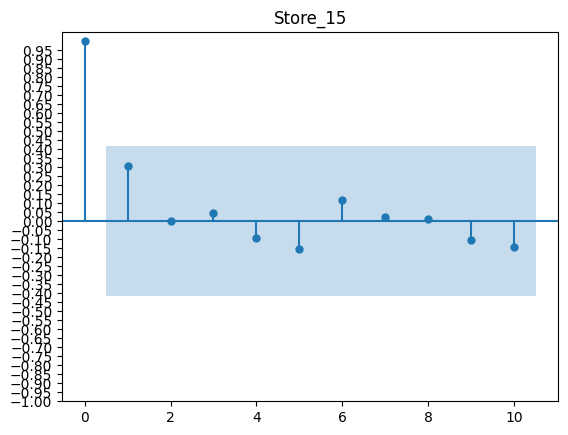

[ 1.00000000e+00  6.15502230e-01  1.28592635e-01 -5.71341964e-02
  1.59778460e-01 -2.88076820e-01 -4.91603579e-02  2.82077241e-03
 -4.52936533e-02  7.91772735e-02 -1.85817016e-01 -4.18662038e-02
 -4.88709437e-04 -7.56542304e-02  3.50401565e-02 -2.48126277e-02
 -1.17566729e-01 -1.80548828e-01 -1.26560217e-01  1.07721916e-01
  7.79753809e-02  4.61954909e-02]


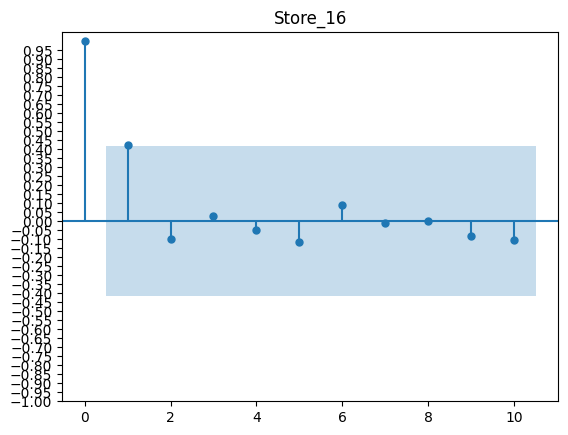

[ 1.          0.22157461  0.321198    0.08742062  0.02600061 -0.19664188
  0.11189301  0.08240989  0.0194412  -0.01360388  0.03987838  0.13145027
 -0.06866936 -0.03885969  0.02718582  0.278335   -0.28177359  0.03037151
  0.002968   -0.0283935   0.31203214 -0.06411025]


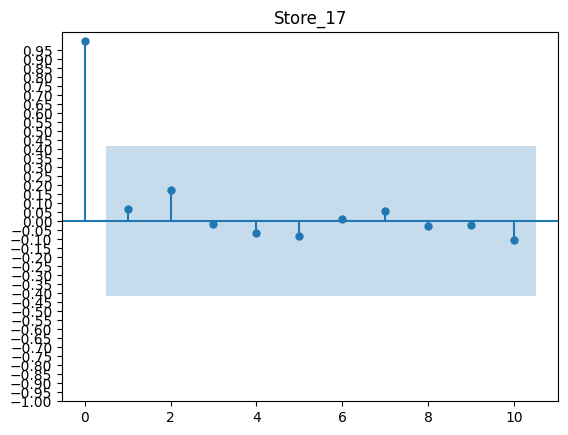

[ 1.          0.43649931  0.17834202 -0.05569709  0.12006334 -0.34853256
  0.05703242  0.17713844 -0.08239449  0.03171295 -0.15344599 -0.03873427
 -0.09559513  0.05920717 -0.05451101  0.03959437  0.05322379 -0.00548821
 -0.10366345 -0.02935384  0.045269    0.01385797]


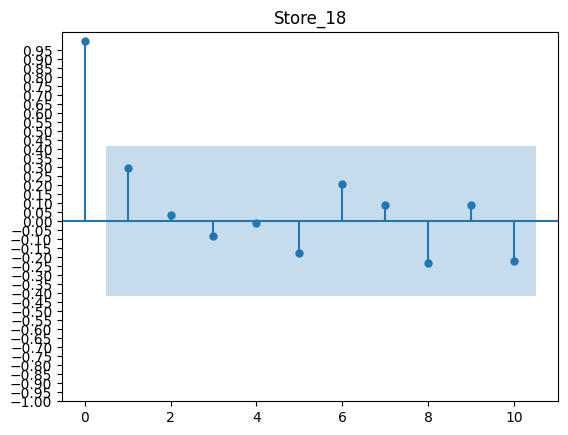

[ 1.          0.37057644  0.06876284 -0.08740229  0.11315569 -0.27354916
 -0.00633643  0.07672021 -0.07461093 -0.00564839 -0.08166808  0.01815323
 -0.06576265 -0.02822043  0.01577898  0.12617239 -0.02440568 -0.09920444
 -0.16499509 -0.01703465  0.09183312 -0.06846006]


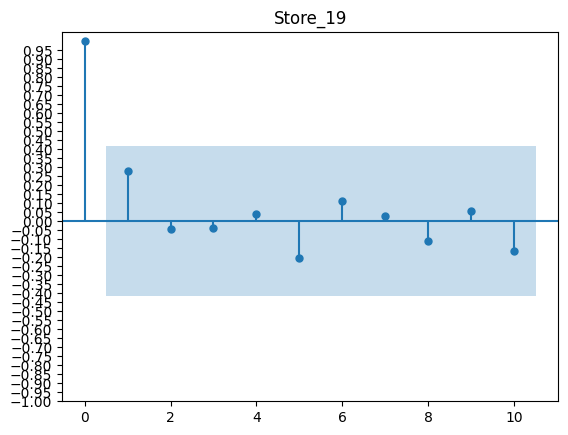

[ 1.00000000e+00  3.82571592e-01  9.26873158e-02 -2.60022434e-02
  1.32718184e-01 -3.02944505e-01  6.88416208e-02  9.99670434e-02
 -3.63345049e-02  2.46654275e-02 -1.01405797e-01 -4.64273699e-02
 -1.96628292e-02 -4.56542009e-02 -3.88473667e-03  1.99985451e-02
 -5.41306737e-02  5.87682541e-04 -1.29729877e-01  3.88779807e-02
 -6.43042099e-02 -5.37410983e-02]


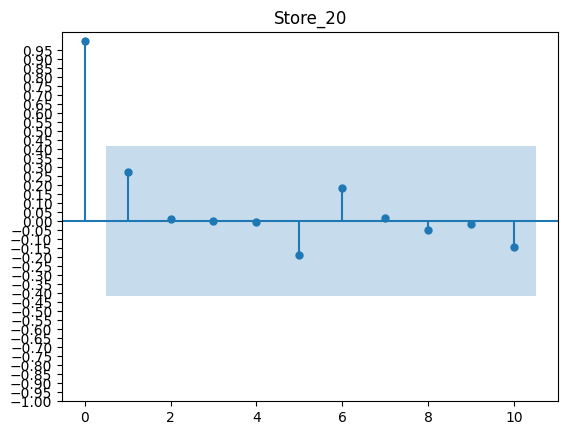

[ 1.          0.42999367  0.01813582  0.02962673  0.18811468 -0.39509566
 -0.08478665  0.05720806 -0.02714942  0.10852539 -0.08691493 -0.12543794
  0.03277128 -0.02193539  0.07749476  0.03043944  0.04616038  0.11304951
 -0.03125378 -0.09984561 -0.09334282 -0.05983377]


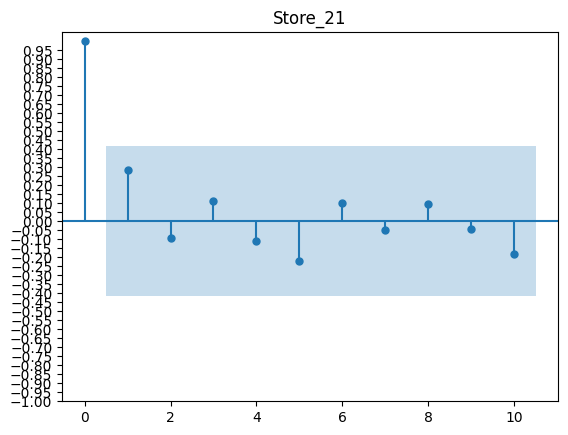

[ 1.          0.42138177  0.12516382 -0.03267007  0.10053671 -0.42337265
  0.03915489  0.1080529  -0.08853099 -0.04423239 -0.17375266 -0.07618315
 -0.07857248  0.02313566 -0.11455793  0.01154797 -0.00832972 -0.0268431
 -0.18495934 -0.11989771 -0.02511321 -0.04455177]


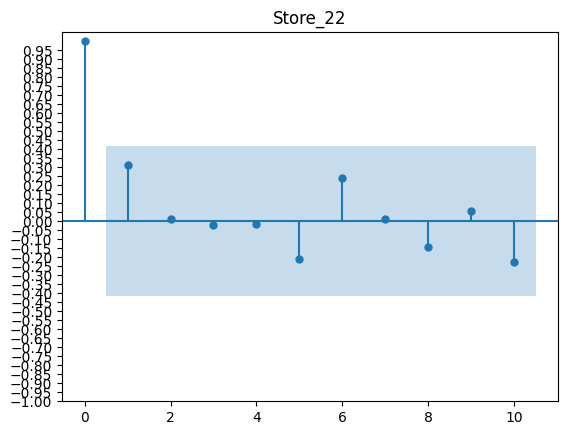

[ 1.          0.52325139  0.06767193 -0.1020331   0.04721354 -0.33806226
  0.03891122  0.02995574 -0.06615102 -0.01128235 -0.1579671  -0.03557774
 -0.1166565  -0.00564258 -0.04862571  0.03280853  0.00831079 -0.10412295
 -0.18254192 -0.06942232 -0.08765122  0.01071252]


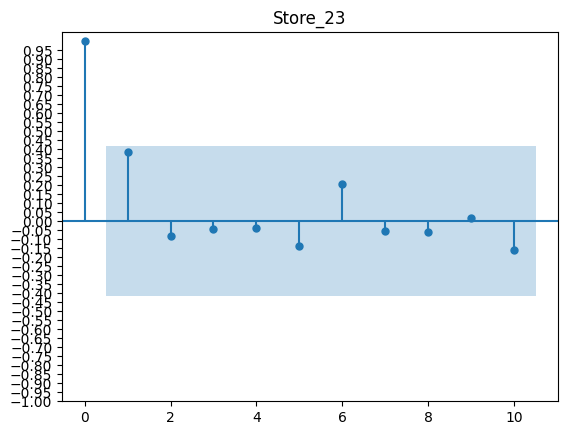

[ 1.          0.31214557  0.06639351 -0.05182534  0.19127348 -0.25985865
 -0.06292417  0.07044177 -0.11457045  0.04441739 -0.11723673 -0.0524074
 -0.1761718  -0.0522437  -0.01665387  0.02129584 -0.16523519 -0.02032372
 -0.12395938 -0.10026148  0.10403495 -0.16496089]


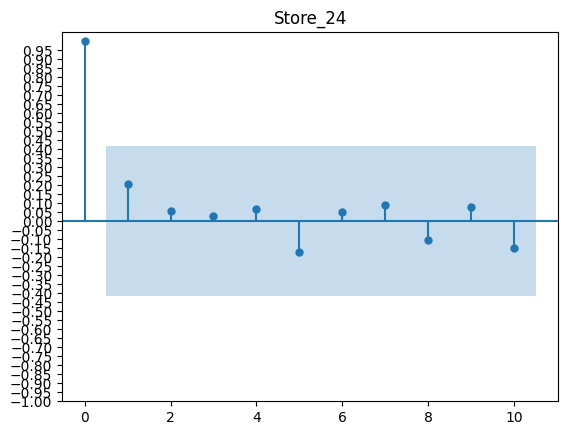

[ 1.          0.55777936  0.10492882  0.00587229  0.05739543 -0.38628122
  0.00967693  0.0322517  -0.09219739 -0.02257488 -0.15063321 -0.08383687
 -0.05811438 -0.09186007  0.00208187 -0.02342976 -0.08541346  0.00836616
 -0.2197537  -0.03622537 -0.01503263 -0.07327121]


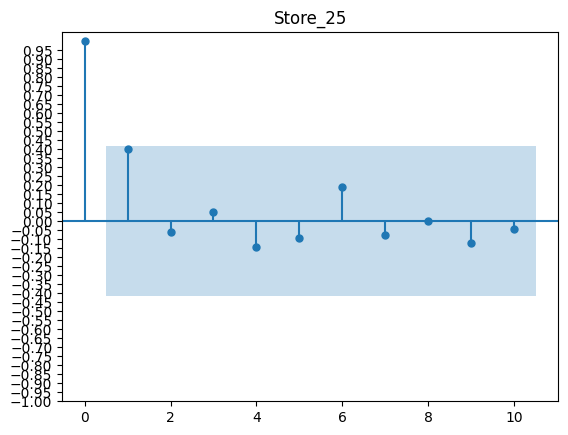

[ 1.          0.34088648  0.15638372 -0.0860815   0.21737627 -0.25791401
 -0.09526563  0.14507815 -0.08451968  0.06297096 -0.09834027 -0.00491106
 -0.13195364 -0.00633809 -0.02303026 -0.00774995 -0.05190899 -0.03911745
 -0.07966707 -0.06440917  0.00151004 -0.04514105]


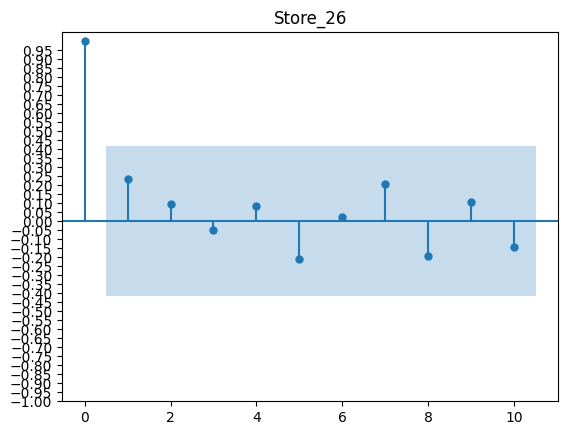

[ 1.          0.36657772  0.1712326   0.00218533  0.1453968  -0.32327802
 -0.00847213 -0.00187658 -0.04968112  0.06917195 -0.17506259  0.02626377
 -0.13186576 -0.01160275  0.06624344  0.0207575  -0.01272118 -0.03478976
 -0.12255475 -0.02325743  0.11774259 -0.00796275]


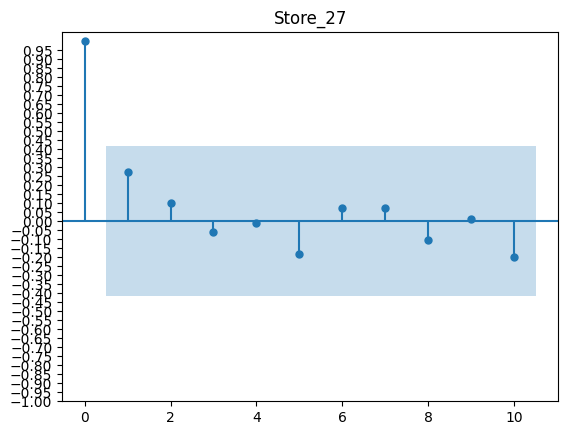

[ 1.          0.12612203  0.04217189 -0.00155108  0.41389287 -0.19126499
 -0.16336947 -0.03522119 -0.14132849  0.39777593 -0.02758415 -0.09152083
  0.07105843 -0.0330885   0.01254911 -0.01679488 -0.03058455  0.04578499
  0.04738997 -0.16009514 -0.20191611 -0.18759439]


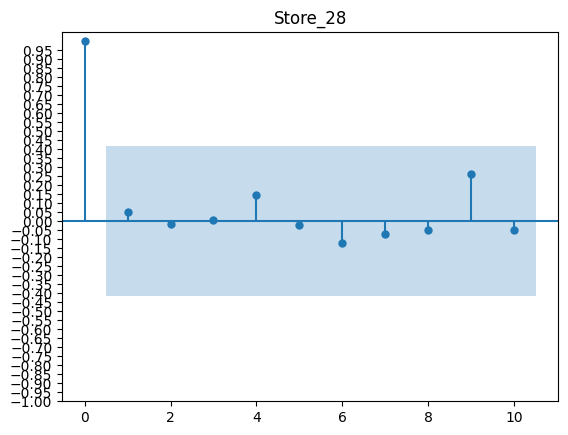

[ 1.          0.37447471  0.07986149  0.05369123  0.13861689 -0.4160105
 -0.01903239  0.08669843 -0.10153581  0.04592157 -0.1605039  -0.12504013
 -0.0073182  -0.06580141 -0.08665378  0.02362925 -0.05292016 -0.0251819
 -0.14691874 -0.1707839   0.02018962 -0.02693753]


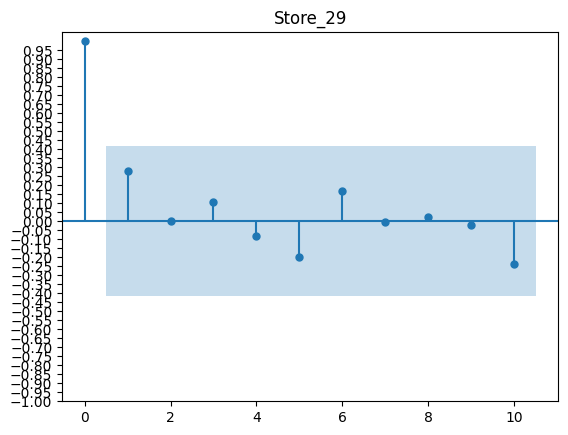

[ 1.         -0.55671099 -0.41970899 -0.40013869  0.14506917  0.06732725
 -0.31948599  0.06327576 -0.04958798  0.05119361 -0.07962215 -0.09644544
 -0.05971749  0.02728294 -0.17997043 -0.06410439 -0.09468464  0.08098556
 -0.04619434  0.02971398 -0.02749896 -0.07689997]


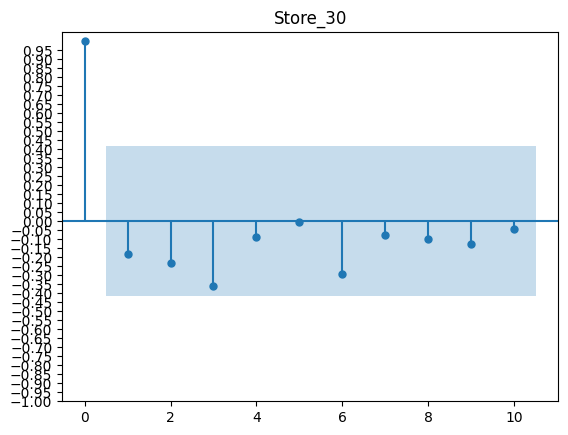

[ 1.          0.26729417  0.10329081  0.06860787  0.34023265 -0.3226782
 -0.05737926  0.12712149 -0.09006113  0.20609376 -0.05625487 -0.07190125
  0.11529193 -0.06731055  0.04663452  0.03795338 -0.03736893  0.11087222
 -0.0554244  -0.05643901 -0.07075794 -0.10608368]


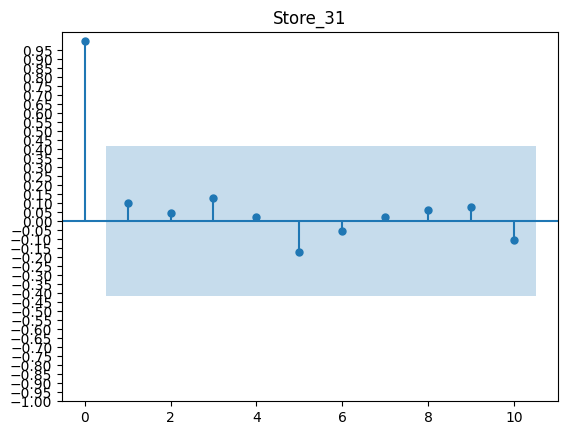

[ 1.          0.36423872  0.14346813 -0.00722623  0.22428713 -0.35905184
 -0.01799927  0.03577654 -0.0195272   0.07484892 -0.09321964 -0.11790134
 -0.02120224 -0.05991561 -0.00655016  0.07617024 -0.00671671  0.04916144
 -0.0508764  -0.00330798 -0.05059174 -0.02179403]


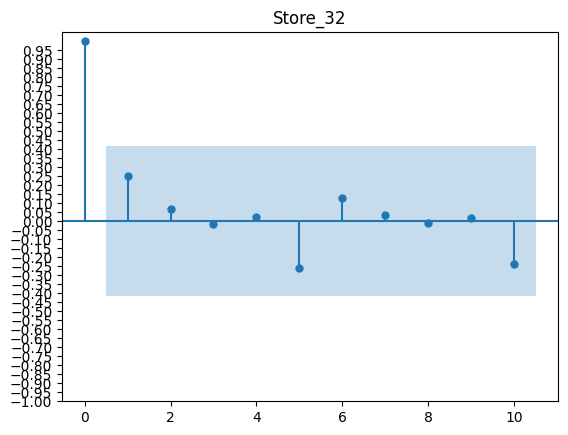

[ 1.          0.47322065 -0.1665001   0.36663392  0.78631435  0.03751456
 -0.3850372   0.05937963 -0.08391869  0.25196318 -0.21703813 -0.09850972
 -0.25781613  0.02660088 -0.16414356 -0.15499991 -0.04827088  0.00241634
  0.05258657  0.02468034  0.01364704 -0.02245327]


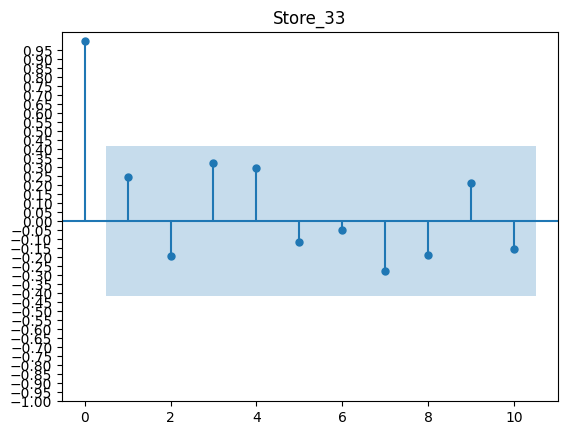

[ 1.          0.29938582  0.12198061  0.0213117   0.25380991 -0.30277401
 -0.04189362  0.15763876 -0.05062457  0.07760656 -0.08666518 -0.07740744
  0.08425054 -0.12561687  0.04419083  0.09639094 -0.09089354  0.04648407
 -0.0562736  -0.05146486 -0.00978894 -0.08484804]


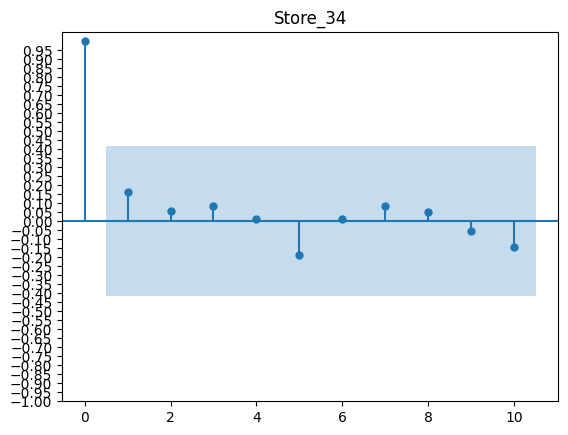

[ 1.00000000e+00  5.12271404e-01  2.12461559e-01  1.21096691e-01
  3.03618736e-01 -3.26194914e-01 -3.33193634e-02  8.81527232e-02
 -4.15367826e-02  2.23347540e-01  3.06428616e-02  8.92626293e-02
 -2.15042961e-02 -8.48289699e-02  8.49952822e-02  6.21152051e-02
  1.25381420e-01  4.13166291e-02 -6.92862306e-02  1.57553156e-02
 -8.56928295e-04  2.65302536e-02]


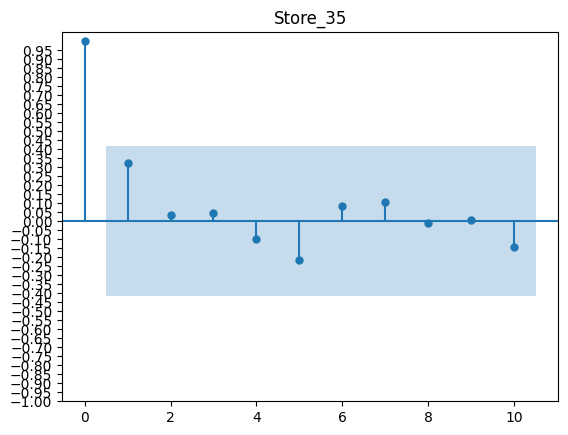

[ 1.         -0.24336762 -0.41559208 -0.67476415 -0.04457297  0.1717505
  0.08701317 -0.14117758 -0.26049393  0.01637355  0.10387564 -0.04848484
 -0.13328117  0.04458351 -0.05567245 -0.12681484 -0.06789229  0.02436869
 -0.02458957 -0.1351456   0.04974733 -0.21787672]


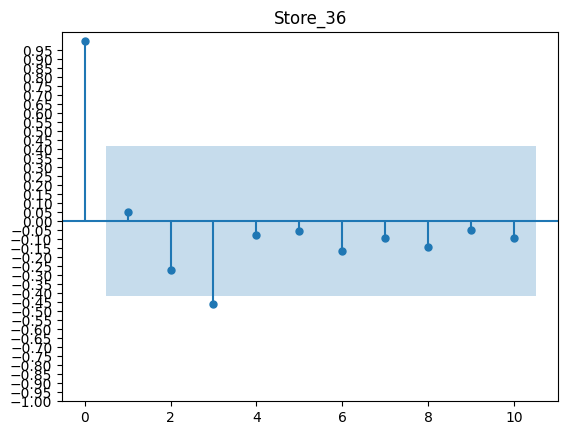

[ 1.          0.04536643  0.19994356  0.15438997  0.23813805 -0.01095874
  0.02730837  0.07022378  0.00805951  0.02999661 -0.11025125  0.16481331
 -0.14142856  0.0029206  -0.04328258  0.06058888  0.08748277 -0.04796581
 -0.11561784 -0.0201808  -0.03642868  0.05371219]


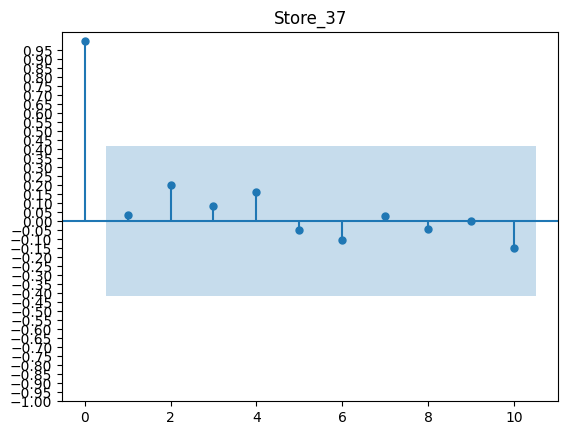

[ 1.         -0.43378672 -0.3702616  -0.71471668 -0.55828604 -0.18002149
 -0.04731024  0.21418104 -0.25927991 -0.04383086  0.01612263  0.14726118
 -0.33839762  0.0213248   0.07935079  0.17177345  0.171225    0.16466279
 -0.15036276  0.02622952  0.13652378 -0.16861097]


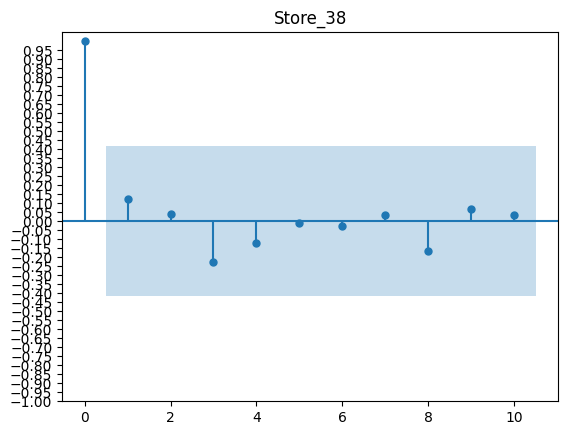

[ 1.          0.49390426  0.18733152  0.07284803  0.25499282 -0.36545367
  0.0037091   0.08072256 -0.08749387  0.19712397 -0.05062739 -0.02654713
  0.08970958 -0.06953561  0.13502873  0.13663001  0.03871091  0.12648374
 -0.0699494  -0.04494533 -0.0082367  -0.05488976]


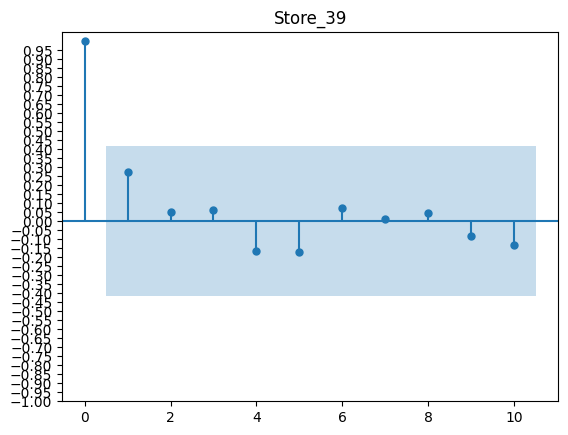

[ 1.          0.28004663  0.14912838 -0.10975736  0.15094279 -0.24958835
 -0.064225    0.07461879 -0.03778061  0.11003111 -0.15614038 -0.08489551
 -0.13986571 -0.02096979 -0.06930987  0.0326203  -0.09269085 -0.04503845
 -0.04060844 -0.11107358  0.04925965 -0.0925152 ]


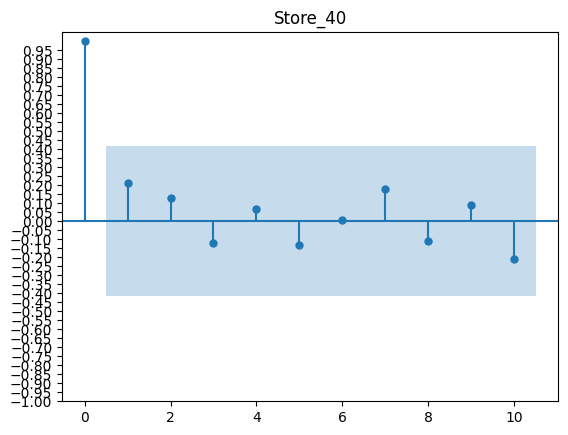

[ 1.00000000e+00  4.26438195e-01  2.27840785e-01  2.01406012e-02
  2.50160137e-01 -3.39196649e-01  2.97166744e-02  1.11155988e-01
 -9.28111596e-02  1.54726680e-01 -6.81965426e-02 -5.86009603e-02
  2.32728670e-02 -1.02715673e-01  1.56550330e-01  1.24667049e-01
 -7.32878498e-03  6.58750423e-02 -4.61235247e-02  7.06507712e-04
  9.35150719e-02 -1.14307258e-01]


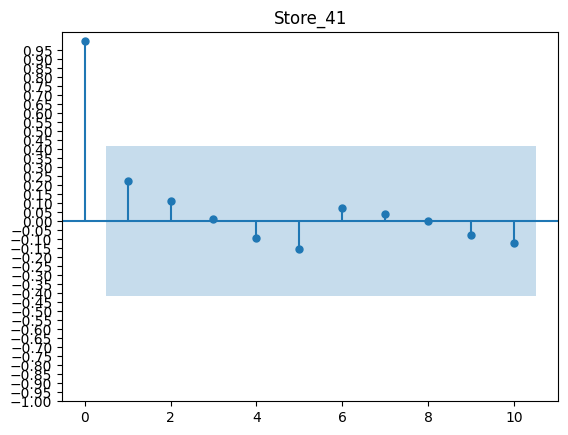

[ 1.         -0.09846161 -0.65397028 -0.84221162 -0.54630861 -0.27958793
  0.00996557  0.45517392 -0.24308265 -0.09441785 -0.00668466  0.19652844
 -0.25432051 -0.04582353 -0.11758752  0.04652713  0.17939619  0.30574829
  0.00976252  0.23326031  0.07992347 -0.33191981]


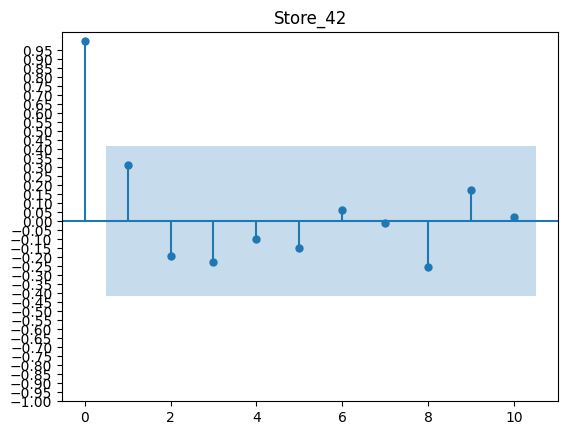

[ 1.         -0.36040603 -0.40868796 -0.65177434 -0.17015749  0.06990131
  0.06775781  0.12294655 -0.27826961 -0.0319797   0.09764004  0.20676335
 -0.08833998 -0.20927276  0.02700804 -0.05409136 -0.08415465 -0.03239913
  0.04850966 -0.06903624 -0.03625966 -0.07777399]


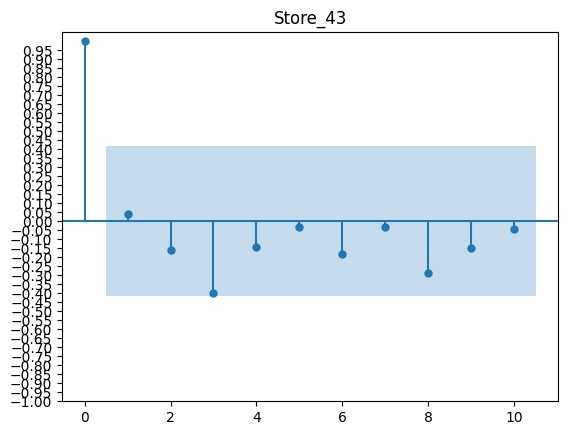

[ 1.         -0.61532387 -0.38991312 -0.42330828 -0.12597939 -0.08890084
 -0.11892825 -0.16830132  0.04469705  0.02115953 -0.02194213 -0.1821258
 -0.15016819  0.03462189  0.01180956 -0.14965485 -0.16505218 -0.02756428
  0.01902371 -0.15428444 -0.02973685 -0.17477834]


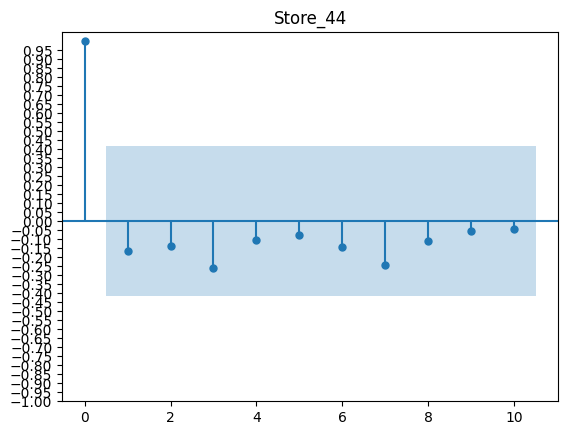

[ 1.          0.38969326  0.11486745 -0.02085884  0.13468598 -0.3511975
  0.02641766  0.06424348 -0.07218373  0.0271374  -0.1238354  -0.07503698
 -0.02594888 -0.05219003 -0.04997979  0.01529946 -0.03028542 -0.0614929
 -0.1280373  -0.03102538 -0.01781585 -0.06529883]


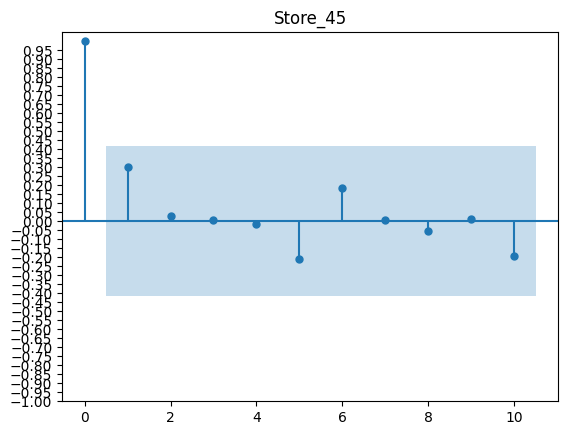

In [262]:
for i in range(1, 46):
    exec(f"PACf = pacf(Store_{i})")
    print(PACf)
    plot_pacf(PACf, lags= 10)
    # plt.figure(figsize=(5,20))
    plt.ylim(1,1)
    plt.title(f"Store_{i}")
    plt.yticks(np.arange(-1, 1, 0.05))
    plt.show()

In [267]:
PACF_sig = pd.DataFrame(columns=["Stores", "significant(p)"])

for i in range(1, 46):
    sig = 0 #1
    exec(f"PACF = pacf(Store_{i}, nlags= 10)")
    for j in PACF:
        if (j >= 0.425) | (j <= -0.425):
            sig+=1
            
        PACF_sig.loc[i-1] = [f"Store_{i}", sig]

In [268]:
PACF_sig

,Stores,significant(p)
0,Store_1,1
1,Store_2,1
2,Store_3,2
3,Store_4,2
4,Store_5,1
5,Store_6,2
6,Store_7,2
7,Store_8,1
8,Store_9,2
9,Store_10,2


In [352]:
sig = pd.DataFrame(columns=["acf_sig", "pacf_sig"])
sig.acf_sig = ACF_sig["significant(q)"]
sig.pacf_sig = PACF_sig["significant(p)"]

#### Train_test_split

In [336]:
# taking 75%(107) of data for training and remaining for testing

for i in range(1, 46):
    exec(f"train_Store_{i} = Store_{i}[:107]")
    exec(f"test_Store_{i} = Store_{i}[107:]")

#### Model Building

In [413]:
# for using in forecast
for i in range(1, 46):
    exec(f"f_Store_{i} = Store_{i}.copy()")

In [271]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

#### Prediction

In [414]:
p= sig.loc[i-1][1]
q= sig.loc[i-1][0]
P= sig.loc[i-1][1]
Q= sig.loc[i-1][0]
for i in range(1, 46):
    exec(f"model_01 = SARIMAX(Store_{i}, order=({p},0,{q}), seasonal_order=({p},0,{Q},10), enforce_stationarity=False)")
    model_01 = model_01.fit()
    exec(f"Store_{i}['pred'] = model_01.predict(start= len(train_Store_{i})+1, end= (len(train_Store_{i})+len(test_Store_{i})),dynamic= False)")

C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueW

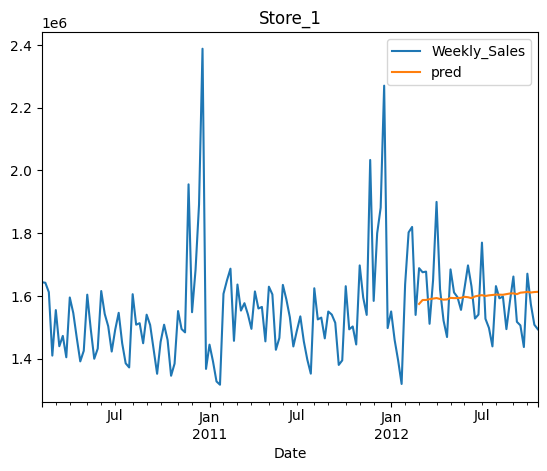

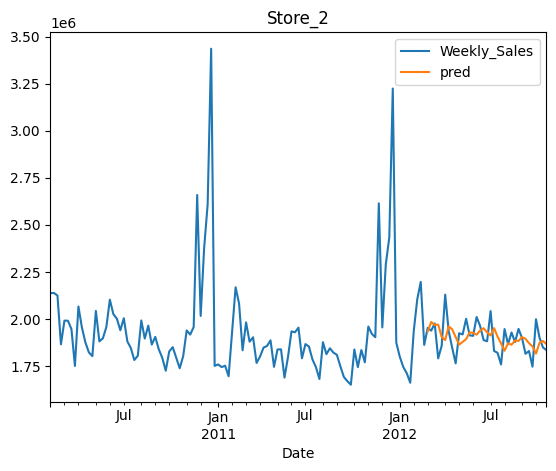

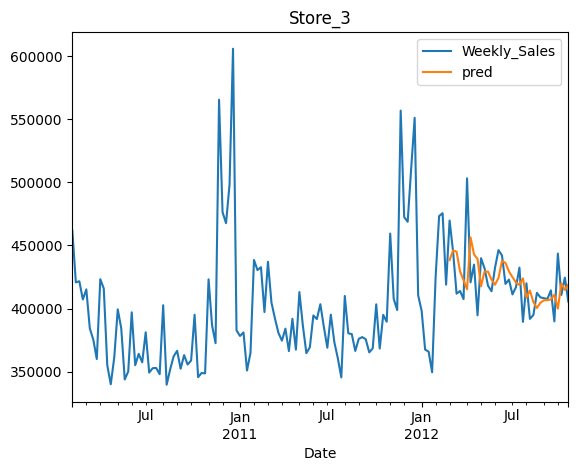

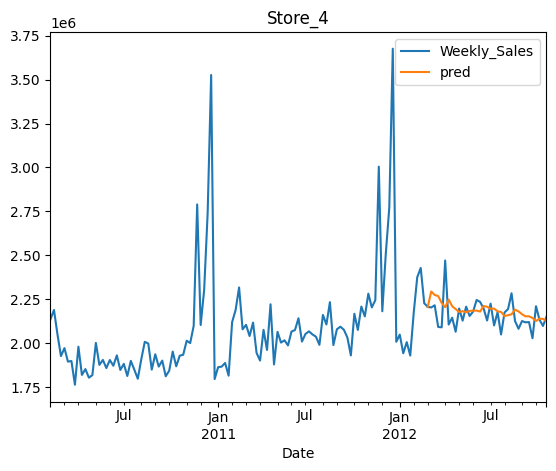

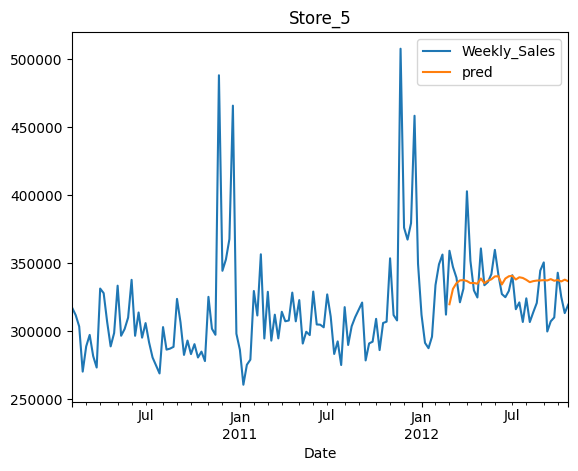

...

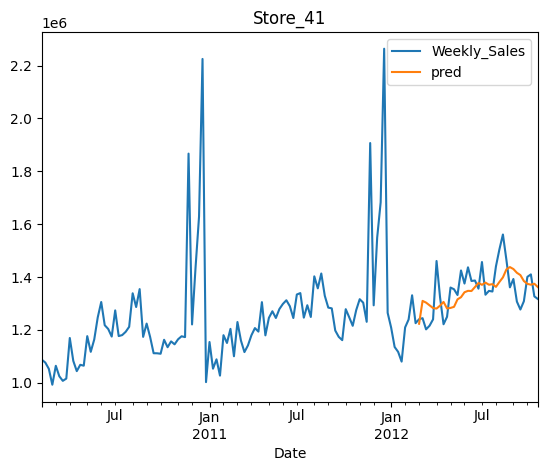

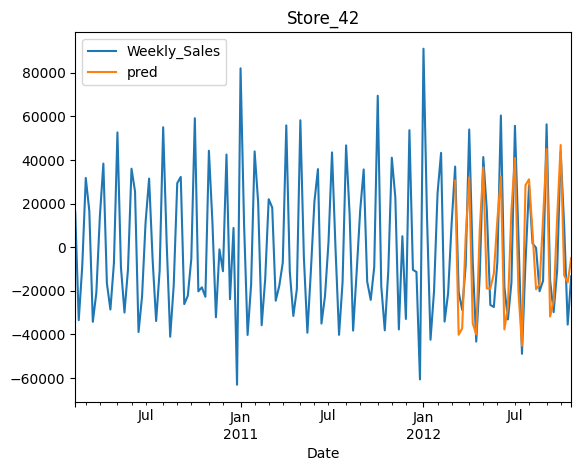

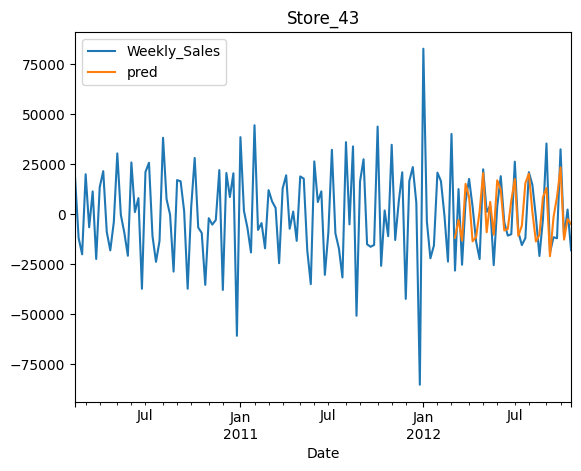

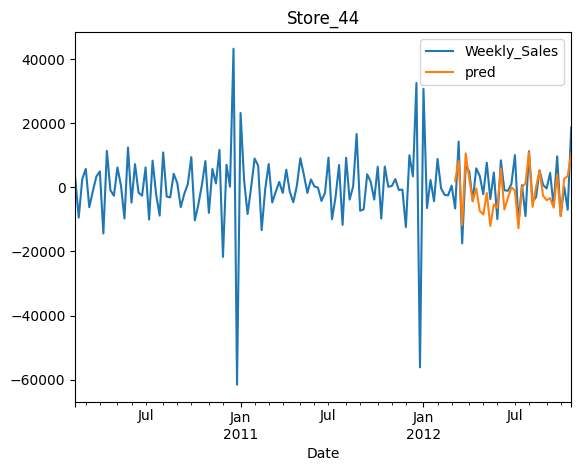

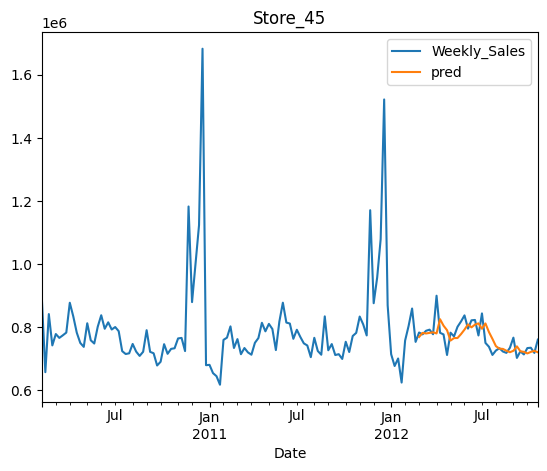

In [409]:
for i in range(1, 46):
    exec(f"Store_{i}.plot()")
    plt.title(f"Store_{i}")
    plt.show()
    print(end= "\n")

#### Forecast


In [437]:
for i in range(1, 46):
    exec(f"model_01 = SARIMAX(f_Store_{i}, order=({p},0,{q}), seasonal_order=({p},0,{Q},10), enforce_stationarity=False)")
    model_01 = model_01.fit()
    exec(f"forecast_Store_{i} = model_01.forecast(steps= 12)")

C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Computech\anaconda3\install\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueW

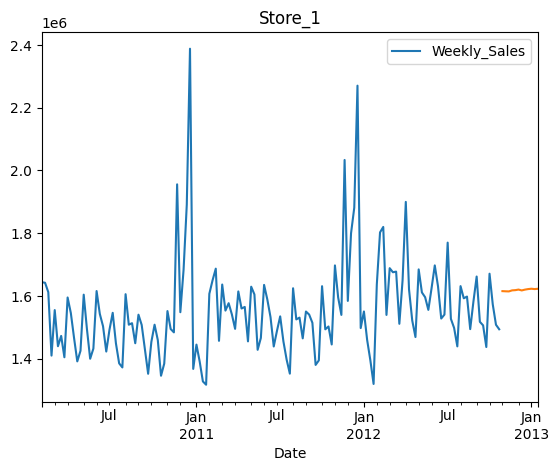

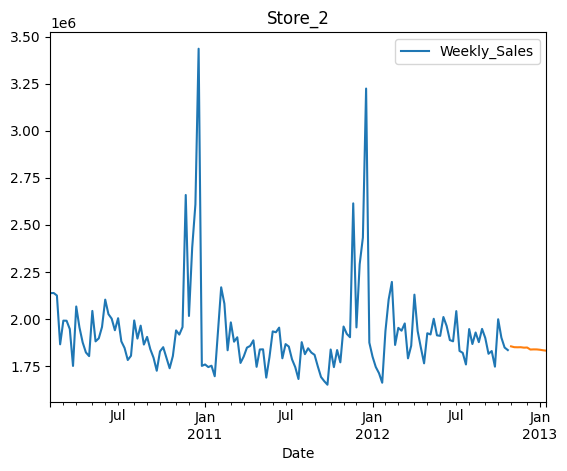

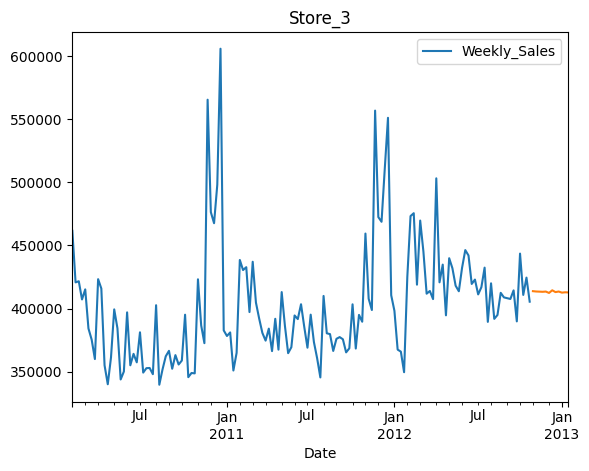

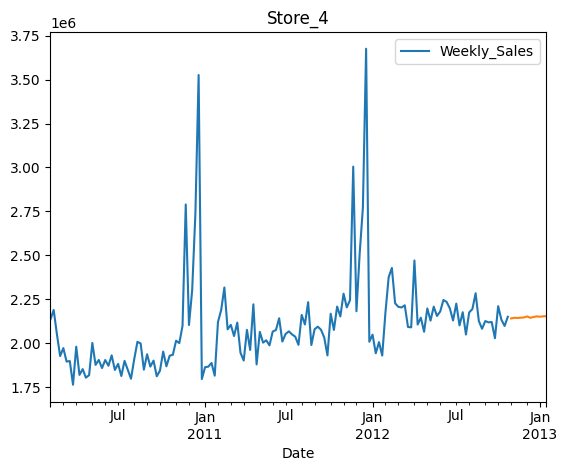

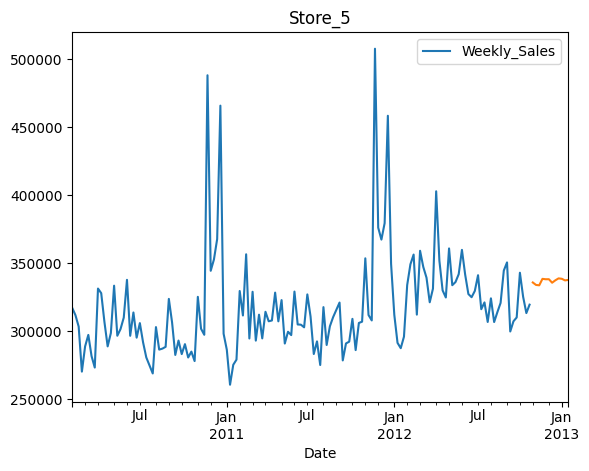

...

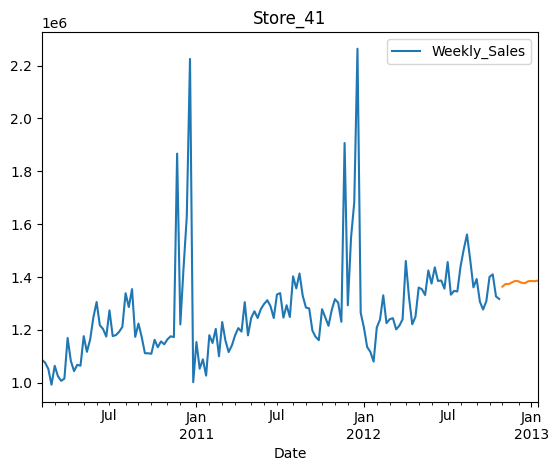

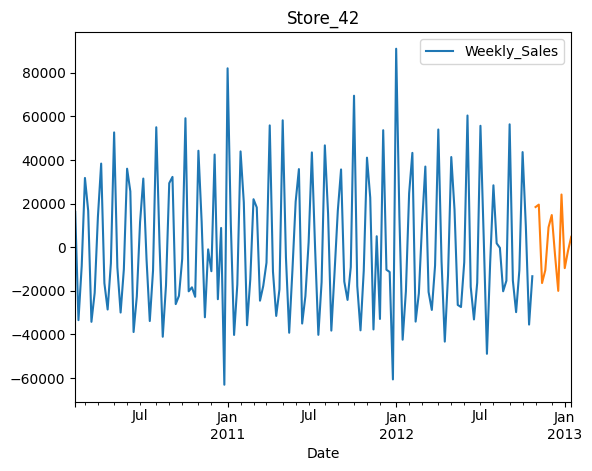

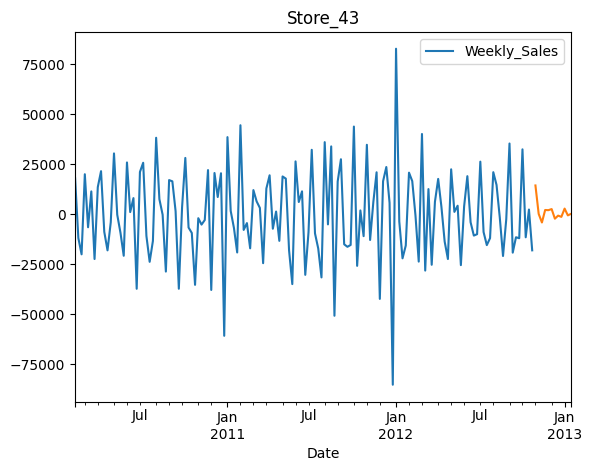

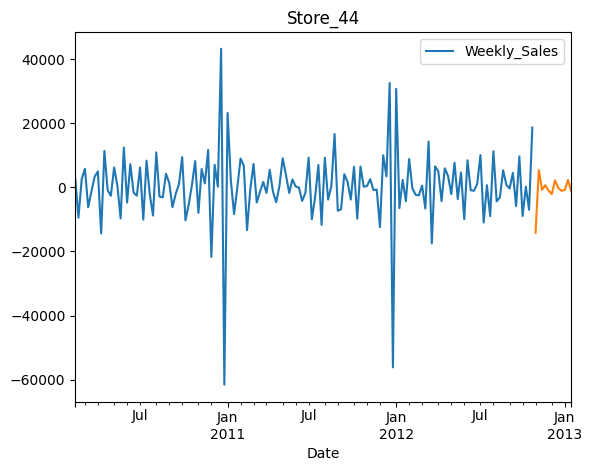

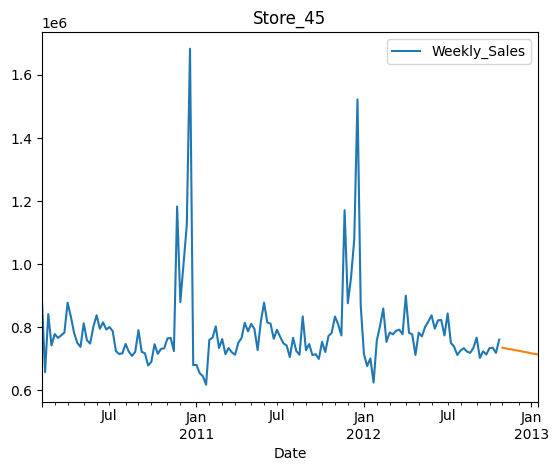

In [438]:
for i in range(1, 46):
    exec(f"f_Store_{i}.plot()")
    exec(f"forecast_Store_{i}.plot()")
    plt.title(f"Store_{i}")
    plt.show()
    print(end= "\n")

In [324]:
for i in range(1, 46):
    print(f"Store_{i}")
    exec(f"print(Store_{i}.Weekly_Sales.sort_values(ascending= False).head(2))")
    print( end= '\n')

Store_1
Date
2010-12-24   2387950.20000000
2011-12-23   2270188.99000000
Name: Weekly_Sales, dtype: float64

Store_2
Date
2010-12-24   3436007.68000000
2011-12-23   3224369.80000000
Name: Weekly_Sales, dtype: float64

Store_3
Date
2010-12-24   605990.41000000
2010-11-26   565567.84000000
Name: Weekly_Sales, dtype: float64

Store_4
Date
2011-12-23   3676388.98000000
2010-12-24   3526713.39000000
Name: Weekly_Sales, dtype: float64

Store_5
Date
2011-11-25   507900.07000000
2010-11-26   488362.61000000
Name: Weekly_Sales, dtype: float64

Store_6
Date
2010-12-24   2727575.18000000
2011-12-23   2644633.02000000
Name: Weekly_Sales, dtype: float64

Store_7
Date
2011-12-23   1059715.27000000
2010-12-24   1045124.88000000
Name: Weekly_Sales, dtype: float64

Store_8
Date
2010-12-24   1511641.09000000
2011-12-23   1462254.05000000
Name: Weekly_Sales, dtype: float64

Store_9
Date
2011-12-23   905324.68000000
2010-12-24   873347.55000000
Name: Weekly_Sales, dtype: float64

Store_10
Date
2010-12-24 

###### 